In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from astropy import units as u
from astropy.time import Time
from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy.visualization import simple_norm

import galsim
from romanisim import log, wcs, persistence, parameters
from romanisim import ris_make_utils as ris
import roman_datamodels as rdm

from romancal import pipeline

In [2]:
import logging

# Simulate catalog from Gaia

We use RA,Dec coordinates near the galactic bulge 

In [3]:
# WFI piel scale
scale = 0.11
# GB coords
coord = SkyCoord(l=1.5 * u.deg, b=-1.5 * u.deg, frame="galactic")
print(coord.transform_to("icrs").ra.deg, coord.transform_to("icrs").dec.deg)
# single Chip radius
rad = np.hypot(4000, 4000) * scale * u.arcsec
print(rad.to("deg") * 2)
# observing time
time = Time("2027-02-14", format='isot', scale='utc')

268.74940735017276 -28.41749511827225
0.3456966485800899 deg


In [158]:
star_catalog = Table.read("../data/catalogs/gaia_gbtds_s01.ecsv")
# drop nan values in coords
star_catalog = star_catalog[np.isfinite(star_catalog["ra"].value)]
star_catalog["g_mag"] = np.log10(star_catalog["F146"]) * (-2.5)
star_catalog

/tmp/ipykernel_3198/1404748061.py:4: RuntimeWarning: divide by zero encountered in log10
  star_catalog["g_mag"] = np.log10(star_catalog["F146"]) * (-2.5)


ra,dec,type,n,half_light_radius,pa,ba,F087,F062,F213,F146,F129,F184,F106,F158,g_mag
float64,float64,str3,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64
268.04097318268356,-28.812925677564234,PSF,-1,-1,-1,-1,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,1.1397570477788271e-08,19.857969284057617
268.0417764258617,-28.81194139952444,PSF,-1,-1,-1,-1,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,1.3125181453258158e-08,19.704736709594727
268.04180233369465,-28.81073784729709,PSF,-1,-1,-1,-1,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,1.6661233593732705e-08,19.44573211669922
268.15412616490767,-29.02644136013421,PSF,-1,-1,-1,-1,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,8.179209537609692e-08,17.71822166442871
267.77052262826516,-28.349681426160366,PSF,-1,-1,-1,-1,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,6.667748141473976e-09,20.440052032470703
268.43421817329545,-28.153008877255846,PSF,-1,-1,-1,-1,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,9.34771394501508e-09,20.0732364654541
268.58571253243434,-28.588913223652828,PSF,-1,-1,-1,-1,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,8.684216086778715e-08,17.653173446655273
268.68801178381096,-28.140015080214894,PSF,-1,-1,-1,-1,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,1.0394338957937862e-08,19.9580078125
268.87930881443845,-28.31329588457215,PSF,-1,-1,-1,-1,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,1.5625033364242772e-08,19.51544761657715


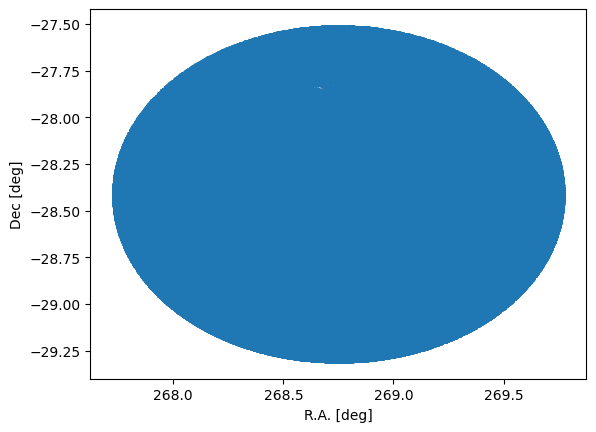

In [159]:
plt.scatter(star_catalog["ra"].value, star_catalog["dec"].value, s=1)
plt.xlabel("R.A. [deg]")
plt.ylabel("Dec [deg]")
plt.show()

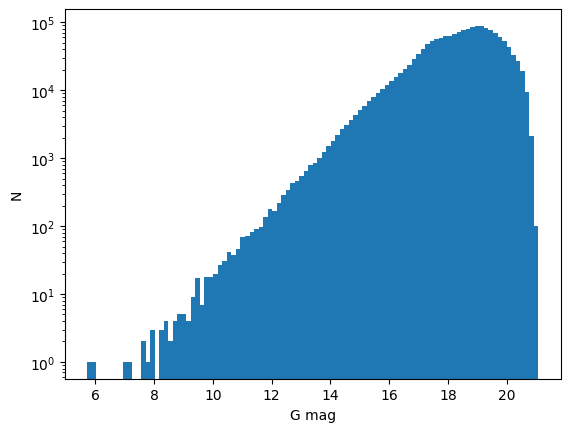

In [160]:
plt.hist(star_catalog["g_mag"].value, bins=100, log=True)
plt.xlabel("G mag")
plt.ylabel("N")
plt.show()

### Make a smaller catalog with less/brighter sources

This is only to speed up image simulation

In [163]:
bright_catalog = star_catalog[star_catalog["g_mag"] <= 18]
bright_catalog = bright_catalog[(bright_catalog["ra"] >= 268.5) & (bright_catalog["ra"] <= 268.8)]
bright_catalog = bright_catalog[(bright_catalog["dec"] >= -28.75) & (bright_catalog["dec"] <= -28.25)]
bright_catalog = bright_catalog[np.random.choice(np.arange(0, len(bright_catalog)), size=2000)]
bright_catalog

ra,dec,type,n,half_light_radius,pa,ba,F087,F062,F213,F146,F129,F184,F106,F158,g_mag
float64,float64,str3,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64
268.5180451549174,-28.720117972299377,PSF,-1,-1,-1,-1,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,3.5870282931720685e-07,16.113162994384766
268.58171558623235,-28.482458723822397,PSF,-1,-1,-1,-1,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,7.339650058246983e-08,17.835811614990234
268.78103027911266,-28.418656705248562,PSF,-1,-1,-1,-1,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,6.582184570608285e-08,17.95407485961914
268.660029416375,-28.67574964360272,PSF,-1,-1,-1,-1,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,1.7783887520753944e-07,16.87493324279785
268.7977015698934,-28.44340432393307,PSF,-1,-1,-1,-1,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,6.764422304660741e-08,17.924423217773438
268.5426662356128,-28.749932601350665,PSF,-1,-1,-1,-1,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,2.9835004297463556e-07,16.31318473815918
268.5778351682929,-28.601944157557337,PSF,-1,-1,-1,-1,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,1.8751507755226374e-07,16.81740951538086
268.6625772188601,-28.66047041603407,PSF,-1,-1,-1,-1,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,2.2959230935617356e-07,16.597606658935547
268.7784473634854,-28.527018745898083,PSF,-1,-1,-1,-1,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,1.8650027386291166e-07,16.823301315307617


In [4]:
bright_catalog = Table.read("../data/catalogs/gaia_gbtds_s01_sample.ecsv")

In [5]:
logging.disable(logging.INFO)

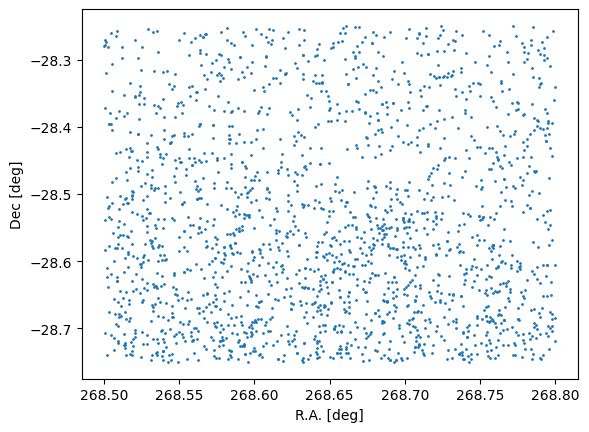

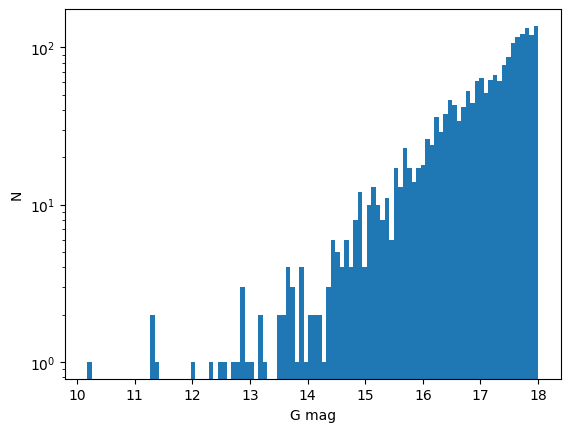

In [6]:
plt.scatter(bright_catalog["ra"].value, bright_catalog["dec"].value, s=1)
plt.xlabel("R.A. [deg]")
plt.ylabel("Dec [deg]")
plt.show()

plt.hist(bright_catalog["g_mag"].value, bins=100, log=True)
plt.xlabel("G mag")
plt.ylabel("N")
plt.show()

# Simulate image with

In [7]:
import argparse
import asdf

In [8]:
args = argparse.Namespace()
args.filename = "../data/imgs/roman_wfi_F146_gbtds_s01_sample_uncal.asdf"
args.bandpass = "F146"
args.boresight = False
args.catalog = "../data/catalogs/gaia_gbtds_s01_sample.ecsv"
args.config = None
args.date = time.iso.split(" ")[0]
args.level = 1
args.ma_table_number = 4
args.nobj = 5000
args.previous = None
args.radec = (268.75, -28.41)
args.rng_seed = 10
args.roll = 0
args.sca = 2
args.usecrds = True
args.webbpsf = False
args.truncate = None
args.pretend_spectral = None
args.drop_extra_dq = False
args.scale_factor = -1

vars(args)

{'filename': '../data/imgs/roman_wfi_F146_gbtds_s01_sample_uncal.asdf',
 'bandpass': 'F146',
 'boresight': False,
 'catalog': '../data/catalogs/gaia_gbtds_s01_sample.ecsv',
 'config': None,
 'date': '2027-02-14',
 'level': 1,
 'ma_table_number': 4,
 'nobj': 5000,
 'previous': None,
 'radec': (268.75, -28.41),
 'rng_seed': 10,
 'roll': 0,
 'sca': 2,
 'usecrds': True,
 'webbpsf': False,
 'truncate': None,
 'pretend_spectral': None,
 'drop_extra_dq': False,
 'scale_factor': -1}

### Roman Multi Acumulation Table 4

![Roman Multi Acumulation Table 4](https://roman-docs.stsci.edu/raug/files/29065975/131892851/1/1736201239615/Screenshot+2024-12-30+at+5.43.19%E2%80%AFPM.png)

In [9]:
metadata = ris.set_metadata(
        date=args.date, bandpass=args.bandpass,
        sca=args.sca, ma_table_number=args.ma_table_number,
        truncate=args.truncate, scale_factor=args.scale_factor)
if args.radec is not None:
        coord = SkyCoord(ra=args.radec[0] * u.deg, dec=args.radec[1] * u.deg,
                         frame='icrs')
        wcs.fill_in_parameters(metadata, coord, boresight=args.boresight, pa_aper=args.roll)
metadata

{'instrument': {'name': 'WFI', 'detector': 'WFI02', 'optical_element': 'F146'},
 'ephemeris': {'time': np.float64(61450.0),
  'spatial_x': np.float64(-120591082.38586132),
  'spatial_y': np.float64(77705971.07916296),
  'spatial_z': np.float64(33696754.929317),
  'velocity_x': np.float64(-17.689423226082287),
  'velocity_y': np.float64(-22.404094686951428),
  'velocity_z': np.float64(-9.711731891155186)},
 'exposure': {'start_time': <Time object: scale='utc' format='isot' value=2027-02-14T00:00:00.000>,
  'type': 'WFI_IMAGE',
  'ma_table_number': 4,
  'read_pattern': [[1],
   [2],
   [3, 4],
   [5, 6, 7, 8, 9],
   [10, 11, 12, 13, 14, 15, 16, 17],
   [18, 19, 20, 21, 22, 23, 24, 25],
   [26, 27, 28, 29, 30, 31, 32, 33],
   [34, 35, 36, 37, 38, 39, 40, 41],
   [42]],
  'truncated': False},
 'pointing': {'target_ra': np.float64(268.75),
  'target_dec': np.float64(-28.41),
  'target_aperture': 'WFI_CEN'},
 'velocity_aberration': {'scale_factor': np.float64(1.0000008152610356)},
 'wcsinfo'

In [10]:
rng = galsim.UniformDeviate(args.rng_seed)
cat = ris.create_catalog(metadata=metadata, catalog_name=args.catalog,
                             bandpasses=[args.bandpass], rng=rng,
                             nobj=args.nobj, usecrds=args.usecrds)
len(cat)

1950

In [11]:
persist = persistence.Persistence()
persist

In [12]:
image_l1 = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_sample_uncal.asdf")
image_l1.info(max_rows=(None))

root (AsdfObject)
├─asdf_library (Software)
│ ├─author (str): The ASDF Developers
│ ├─homepage (str): http://github.com/asdf-format/asdf
│ ├─name (str): asdf
│ └─version (str): 3.5.0
├─history (dict)
│ └─extensions (list)
│   ├─[0] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://asdf-format.org/core/extensions/core-1.5.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): asdf_standard
│   │ │ └─version (str): 1.1.1
│   │ └─software (Software)
│   │   ├─name (str): asdf-astropy
│   │   └─version (str): 0.7.0
│   ├─[1] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://stsci.edu/datamodels/roman/extensions/datamodels-1.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): rad
│   │ │ └─version (str): 0.22.0
│   │ └─software (Software)
│   │   ├─name (str): roman_datamodels
│   │   └─version (str): 0.22.0
│   ├─[2] 

In [13]:
with rdm.open("../data/imgs/roman_wfi_F146_gbtds_s01_sample_cal.asdf") as model:
    wcs_sol = wcs.get_wcs(model)
row, col = np.mgrid[0 : image_l1["roman"]["data"].shape[1], 0 : image_l1["roman"]["data"].shape[2]]
ra, dec = wcs_sol.toWorld(col, row, units="deg")

In [14]:
logging.disable(logging.INFO)

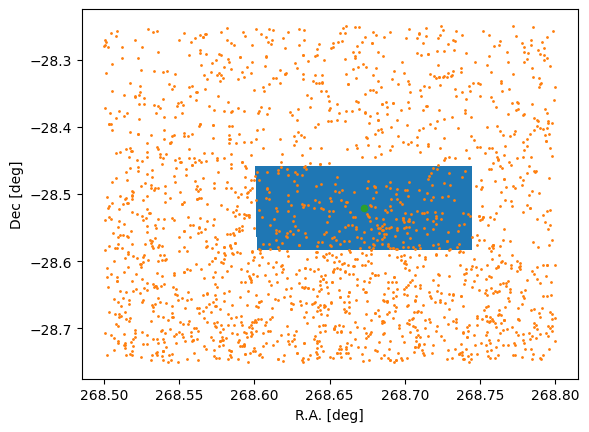

In [15]:
plt.scatter(ra.ravel(), dec.ravel(), s=1)
plt.scatter(bright_catalog["ra"].value, bright_catalog["dec"].value, s=1)
plt.scatter(image_l1["roman"]["meta"]["wcsinfo"]["ra_ref"], image_l1["roman"]["meta"]["wcsinfo"]["dec_ref"], s=20)
plt.xlabel("R.A. [deg]")
plt.ylabel("Dec [deg]")
plt.show()

In [16]:
image_l1["roman"]["data"].shape

(9, 4096, 4096)

In [17]:
ro_n = 5

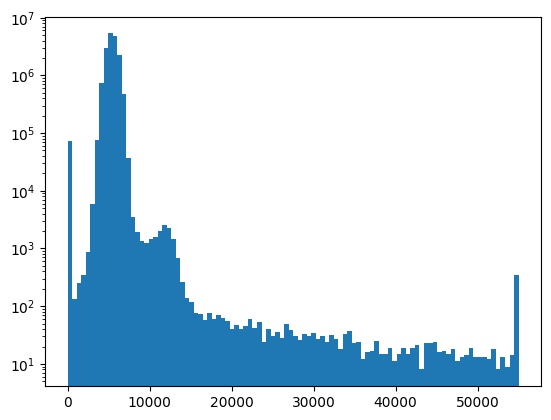

In [18]:
plt.hist(image_l1["roman"]["data"][ro_n].ravel(), bins=100, log=True);

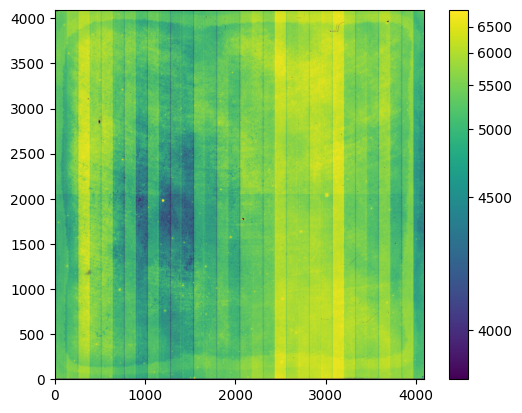

In [19]:
norm = simple_norm(image_l1["roman"]["data"][ro_n], "asinh", percent=98)

cbar = plt.imshow(image_l1["roman"]["data"][ro_n], origin="lower", norm=norm)
plt.colorbar(cbar)
plt.show()

## Roman Calibration Pipeline

In [20]:
import logging
from typing import TYPE_CHECKING
from roman_datamodels.dqflags import group

import romancal.datamodels.filetype as filetype

from romancal.assign_wcs import AssignWcsStep
from romancal.dark_current import DarkCurrentStep
from romancal.datamodels.library import ModelLibrary
from romancal.dq_init import dq_init_step
from romancal.flatfield import FlatFieldStep
from romancal.linearity import LinearityStep
from romancal.photom import PhotomStep
from romancal.ramp_fitting import ramp_fit_step
from romancal.refpix import RefPixStep
from romancal.saturation import SaturationStep
from romancal.lib.basic_utils import is_fully_saturated

from romancal.stpipe import RomanPipeline
from typing import ClassVar

In [21]:
# Define logging
log = logging.getLogger()
log.setLevel(logging.INFO)


class ExposurePipeline(RomanPipeline):
    """
    ExposurePipeline: Apply all calibration steps to raw Roman WFI
    ramps to produce a 2-D slope product. Included steps are documented
    in the ``step_defs``.
    """

    class_alias = "roman_elp"

    spec = """
        save_results = boolean(default=False)
        suffix = string(default="cal")
    """

    # Define aliases to steps
    step_defs: ClassVar = {
        "dq_init": dq_init_step.DQInitStep,
        "saturation": SaturationStep,
        "refpix": RefPixStep,
        "linearity": LinearityStep,
        "dark_current": DarkCurrentStep,
        "rampfit": ramp_fit_step.RampFitStep,
        "assign_wcs": AssignWcsStep,
        "flatfield": FlatFieldStep,
        "photom": PhotomStep,
        # "source_catalog": SourceCatalogStep,
        # "tweakreg": TweakRegStep,
    }

    # start the actual processing
    def process(self, input):
        """Process the Roman WFI data"""

        # make sure source_catalog returns the updated datamodel
        # self.source_catalog.return_updated_model = True
        # make sure we update source catalog coordinates afer running TweakRegStep
        # self.tweakreg.update_source_catalog_coordinates = True
        # make output filenames based on input filenames
        self.output_use_model = True

        log.info("Starting Roman exposure calibration pipeline ...")

        # determine the input type
        file_type = filetype.check(input)
        return_lib = True
        if file_type == "ModelLibrary":
            lib = input
        elif file_type == "asn":
            lib = ModelLibrary(input)
        else:
            # for a non-asn non-library input process it as a library
            lib = ModelLibrary([input])
            # but return it as a datamodel
            return_lib = False

        # Flag to track if any of the input models are fully saturated
        any_saturated = False

        with lib:
            for model_index, model in enumerate(lib):
                self.dq_init.suffix = "dq_init"
                result = self.dq_init.run(model)

                del model

                result = self.saturation.run(result)

                if is_fully_saturated(result):
                    log.info("All pixels are saturated. Returning a zeroed-out image.")
                    result = self.create_fully_saturated_zeroed_image(result)

                    # Track that we've seen a fully saturated input
                    any_saturated = True
                    log.warning(
                        "tweakreg will not be run due to a fully saturated input"
                    )
                else:
                    result = self.refpix.run(result)
                    result = self.linearity.run(result)
                    result = self.dark_current.run(result)
                    result = self.rampfit.run(result)
                    result = self.assign_wcs.run(result)

                    if result.meta.exposure.type == "WFI_IMAGE":
                        result = self.flatfield.run(result)
                        result = self.photom.run(result)
                        # result = self.source_catalog.run(result)
                    else:
                        log.info("Flat Field step is being SKIPPED")
                        log.info("Photom step is being SKIPPED")
                        log.info("Source Detection step is being SKIPPED")
                        log.info("Tweakreg step is being SKIPPED")
                        result.meta.cal_step.flat_field = "SKIPPED"
                        result.meta.cal_step.photom = "SKIPPED"
                        result.meta.cal_step.source_catalog = "SKIPPED"

                if any_saturated:
                    # the input association contains a fully saturated model
                    # where source_catalog can't be run which means we
                    # also can't run tweakreg.
                    result.meta.cal_step.tweakreg = "SKIPPED"
                lib.shelve(result, model_index)

        # Now that all the exposures are collated, run tweakreg
        # Note: this does not cover the case where the asn mixes imaging and spectral
        #          observations. This should not occur on-prem
        # if not any_saturated:
        #     self.tweakreg.run(lib)

        log.info("Roman exposure calibration pipeline ending...")

        # return a ModelLibrary
        if return_lib:
            return lib

        # or a DataModel (for non-asn non-lib inputs)
        with lib:
            model = lib.borrow(0)
            lib.shelve(model)
        return model

    def create_fully_saturated_zeroed_image(self, input_model):
        """
        Create zeroed-out image file
        """
        # The set order is: data, dq, var_poisson, var_rnoise, err
        fully_saturated_model = ramp_fit_step.create_image_model(
            input_model,
            (
                np.zeros(input_model.data.shape[1:], dtype=input_model.data.dtype),
                input_model.pixeldq | input_model.groupdq[0] | group.SATURATED,
                np.zeros(input_model.err.shape[1:], dtype=input_model.err.dtype),
                np.zeros(input_model.err.shape[1:], dtype=input_model.err.dtype),
                np.zeros(input_model.err.shape[1:], dtype=input_model.err.dtype),
            ),
        )

        # Set all subsequent steps to skipped
        for step_str in [
            "refpix",
            "linearity",
            "dark",
            "ramp_fit",
            "assign_wcs",
            "flat_field",
            "photom",
            "source_catalog",
        ]:
            fully_saturated_model.meta.cal_step[step_str] = "SKIPPED"

        # Return zeroed-out image file
        return fully_saturated_model

In [22]:
rpipe = ExposurePipeline()
rpipe

In [262]:
result.info(max_rows=(None))

root (AsdfObject)
└─roman (WfiImage) # Level 2 (L2) Calibrated Roman Wide Field Instrument (WFI) Rate  (truncated)
  ├─meta (dict)
  │ ├─wcs (WCS)
  │ ├─calibration_software_name (CalibrationSoftwareName): RomanCAL # Calibration So (truncated)
  │ ├─calibration_software_version (CalibrationSoftwareVersion): 0.17.0 # Calibratio (truncated)
  │ ├─product_type (ProductType): l2 # Product Type Descriptor
  │ ├─filename (Filename): roman_wfi_F146_gbtds_s01_sample_uncal.asdf # File Name
  │ ├─file_date (FileDate): 2020-01-01T00:00:00.000 # File Creation Date
  │ ├─model_type (ModelType): ImageModel # Data Model Type
  │ ├─origin (Origin): STSCI/SOC # Institution / Organization Name
  │ ├─prd_version (PrdVersion): 8.8.8 # SOC PRD Version Number
  │ ├─sdf_software_version (SdfSoftwareVersion): 7.7.7 # SDF Version Number
  │ ├─telescope (Telescope): ROMAN # Telescope Name
  │ ├─coordinates (Coordinates) # Name Of The Coordinate Reference Frame
  │ │ └─reference_frame (str): ICRS # Name of the C

In [23]:
image_l2 = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_sample_cal.asdf")
image_l2rc = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_sample_cal_romancal.asdf")
image_l2.info(max_rows=(None))

root (AsdfObject)
├─asdf_library (Software)
│ ├─author (str): The ASDF Developers
│ ├─homepage (str): http://github.com/asdf-format/asdf
│ ├─name (str): asdf
│ └─version (str): 3.5.0
├─history (dict)
│ └─extensions (list)
│   ├─[0] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://asdf-format.org/core/extensions/core-1.5.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): asdf_standard
│   │ │ └─version (str): 1.1.1
│   │ └─software (Software)
│   │   ├─name (str): asdf-astropy
│   │   └─version (str): 0.7.0
│   ├─[1] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://stsci.edu/datamodels/roman/extensions/datamodels-1.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): rad
│   │ │ └─version (str): 0.22.0
│   │ └─software (Software)
│   │   ├─name (str): roman_datamodels
│   │   └─version (str): 0.22.0
│   ├─[2] 

In [24]:
# readouts
image_l2["roman"]["data"].shape, image_l2rc["roman"]["data"].shape

((4088, 4088), (4088, 4088))

/tmp/ipykernel_3504/1197422011.py:1: RuntimeWarning: invalid value encountered in log10
  plt.hist(np.log10(image_l2["roman"]["data"].ravel()), bins=100, log=True, label="L2 Gen")
/tmp/ipykernel_3504/1197422011.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(image_l2rc["roman"]["data"].ravel()), range=[-2, 8], bins=100, log=True, label="L2 = cal(L1)")
/tmp/ipykernel_3504/1197422011.py:2: RuntimeWarning: invalid value encountered in log10
  plt.hist(np.log10(image_l2rc["roman"]["data"].ravel()), range=[-2, 8], bins=100, log=True, label="L2 = cal(L1)")


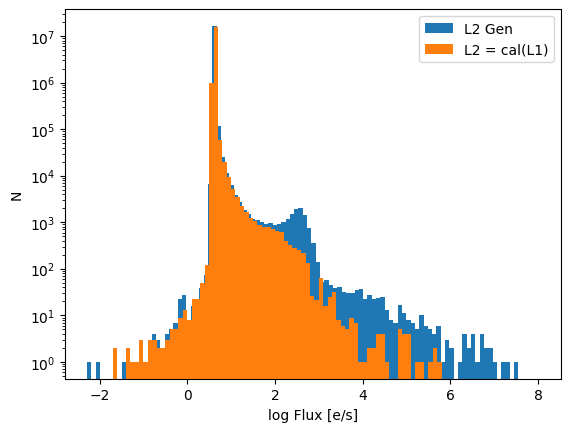

In [25]:
plt.hist(np.log10(image_l2["roman"]["data"].ravel()), bins=100, log=True, label="L2 Gen")
plt.hist(np.log10(image_l2rc["roman"]["data"].ravel()), range=[-2, 8], bins=100, log=True, label="L2 = cal(L1)")
plt.legend()
plt.xlabel("log Flux [e/s]")
plt.ylabel("N")
plt.show()

In [26]:
diff = (image_l2rc["roman"]["data"] - image_l2["roman"]["data"])

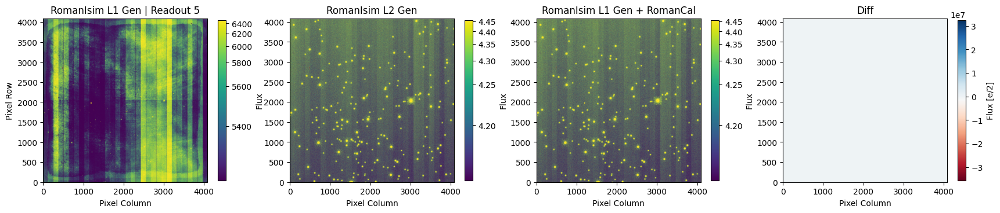

In [27]:
norml1 = simple_norm(image_l1["roman"]["data"][ro_n], "asinh", min_percent=40, max_percent=95)
norml2 = simple_norm(image_l2["roman"]["data"], "asinh", min_percent=40, max_percent=95)

fig, ax = plt.subplots(1, 4, figsize=(21,6))

cbar = ax[0].imshow(image_l1["roman"]["data"][ro_n], origin="lower", norm=norml1)
plt.colorbar(cbar, ax=ax[0], label="Flux", shrink=0.6)
ax[0].set_ylabel("Pixel Row")
ax[0].set_xlabel("Pixel Column")
ax[0].set_title(f"RomanIsim L1 Gen | Readout {ro_n}")

cbar = ax[1].imshow(image_l2["roman"]["data"], origin="lower", norm=norml2)
plt.colorbar(cbar, ax=ax[1], label="Flux", shrink=0.6)
ax[1].set_xlabel("Pixel Column")
ax[1].set_title("RomanIsim L2 Gen")

cbar = ax[2].imshow(image_l2rc["roman"]["data"], origin="lower", norm=norml2)
plt.colorbar(cbar, ax=ax[2], label="Flux", shrink=0.6)
ax[2].set_xlabel("Pixel Column")
ax[2].set_title("RomanIsim L1 Gen + RomanCal")

cbar = ax[3].imshow(image_l2rc["roman"]["data"] - image_l2["roman"]["data"], origin="lower", cmap="RdBu")
plt.colorbar(cbar, ax=ax[3], label="Flux [e/2]", shrink=0.6)
ax[3].set_xlabel("Pixel Column")
ax[3].set_title("Diff")
plt.show()

In [28]:
np.unique(image_l2rc["roman"]["dq"])

array([       0,        1,        4,        5,     1025,     1029,
           8192,     8196,     9217,     9219,     9221,    65536,
          65537,    65540,    66561,    66565,    73728,    74753,
          74757,  1048576,  1049601,  1056768,  1057793,  1114112,
        1115137,  1122304,  1123329, 33554432, 33554435, 33554436,
       33555457, 33555459, 33555461, 33562624, 33562627, 33562628,
       33562629, 33563649, 33563651, 33563653, 33619968, 33619971,
       33619972, 33619973, 33620993, 33620995, 33620997, 33628160,
       33628163, 33628164, 33628165, 33629185, 33629187, 33629189,
       34603008, 34604033, 34611200, 34612225, 34612227, 34612229,
       34668544, 34669569, 34676736, 34676740, 34677761, 34677763,
       34677765], dtype=uint32)

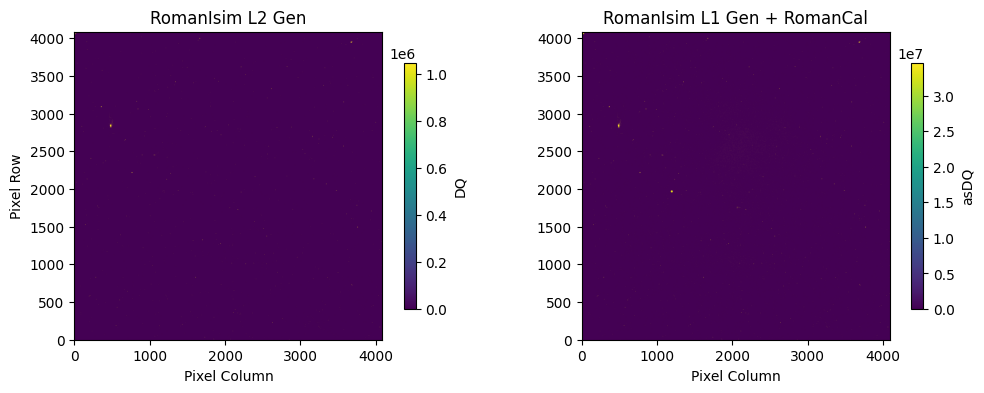

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(12,4))
cbar = ax[0].imshow(image_l2["roman"]["dq"], origin="lower")
plt.colorbar(cbar, ax=ax[0], label="DQ", shrink=0.8)
ax[0].set_ylabel("Pixel Row")
ax[0].set_xlabel("Pixel Column")
ax[0].set_title("RomanIsim L2 Gen")

cbar = ax[1].imshow(image_l2rc["roman"]["dq"], origin="lower")
plt.colorbar(cbar, ax=ax[1], label="asDQ", shrink=0.8)
ax[1].set_xlabel("Pixel Column")
ax[1].set_title("RomanIsim L1 Gen + RomanCal")

plt.show()

In [30]:
print(image_l2["roman"]["meta"]["cal_logs"])
print(image_l2["roman"]["meta"]["cal_step"])
print(image_l2["roman"]["meta"]["calibration_software_name"])
print(image_l2["roman"]["meta"]["calibration_software_version"])

['2021-11-15T09:15:07.12Z :: FlatFieldStep :: INFO :: Completed', '2021-11-15T10:22.55.55Z :: RampFittingStep :: WARNING :: Wow, lots of Cosmic Rays detected']
{'dq_init': 'INCOMPLETE', 'saturation': 'INCOMPLETE', 'refpix': 'INCOMPLETE', 'linearity': 'INCOMPLETE', 'dark': 'INCOMPLETE', 'ramp_fit': 'INCOMPLETE', 'assign_wcs': 'INCOMPLETE', 'flat_field': 'INCOMPLETE', 'photom': 'INCOMPLETE', 'source_detection': 'INCOMPLETE', 'tweakreg': 'INCOMPLETE', 'flux': 'INCOMPLETE', 'skymatch': 'INCOMPLETE', 'outlier_detection': 'INCOMPLETE'}
RomanCAL
9.9.0


In [31]:
list(image_l2["roman"]["meta"].keys())

['background',
 'cal_logs',
 'cal_step',
 'calibration_software_name',
 'calibration_software_version',
 'coordinates',
 'ephemeris',
 'exposure',
 'file_date',
 'filename',
 'guide_star',
 'instrument',
 'model_type',
 'observation',
 'origin',
 'outlier_detection',
 'photometry',
 'pointing',
 'prd_version',
 'product_type',
 'program',
 'rcs',
 'ref_file',
 'sdf_software_version',
 'source_detection',
 'telescope',
 'velocity_aberration',
 'visit',
 'wcs',
 'wcsinfo']

# Simulate asteroids

In [23]:
aster_catalog = pd.read_csv("~/repos/roman-asteroids/data/catalogs/horizon_visbile_asteroids_GB_seasson1_from_JWST.csv", index_col=0)
aster_catalog["rate"] = np.hypot(aster_catalog['RA rate ("/h)'], aster_catalog['Dec rate ("/h)'])
aster_catalog

,Object name,Astrometric RA (hh:mm:ss),"Astrometric Dec (dd mm'ss"")","Dist. from center RA ("")","Dist. from center Dec ("")","Dist. from center Norm ("")",Visual magnitude (V),"RA rate (""/h)","Dec rate (""/h)",ra,...,Perihelion (au),Time of perihelion passage (JD),Longitude of ascending node (deg),Argument of perihelion (deg),Inclination (deg),Epoch (JD),H_mag,name_y,id_y,rate
0,620 Drakonia (A906 UO),17:49:08.50,-29:33:27.8,-489.0,-2000.0,2433.0,16.1,60.090,-5.175,267.285417,...,2.108700,2.460346e+06,359.917850,336.710440,7.733843,2460600.5,11.00,620 Drakonia,A906 UO,60.312426
1,3446 Combes (1942 EB),17:50:52.95,-27:08:28.1,882.0,6000.0,6379.0,18.8,52.520,-5.352,267.720625,...,1.999436,2.461072e+06,34.632565,95.638537,7.680264,2460600.5,13.54,3446 Combes,1942 EB,52.791991
2,9652 (1996 AF2),17:48:17.38,-28:19:33.6,-1000.0,2000.0,2358.0,18.1,68.160,-1.856,267.072417,...,2.009841,2.459964e+06,318.961650,243.383440,5.969964,2460600.5,13.47,9652,1996 AF2,68.185265
3,12723 (1991 PD10),17:50:14.39,-29:38:34.9,376.0,-3000.0,2717.0,19.3,55.890,-2.928,267.559958,...,2.273866,2.460880e+06,331.970910,119.959440,7.270376,2460600.5,14.05,12723,1991 PD10,55.966644
4,14501 Tetsuokojima (1995 WA8),17:48:41.41,-27:37:51.1,-845.0,5000.0,4632.0,20.5,54.710,-3.473,267.172542,...,1.886675,2.460732e+06,0.437692,39.850922,5.294105,2460600.5,15.30,14501 Tetsuokojima,1995 WA8,54.820122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8157,(2018 EK16),17:48:33.78,-30:20:37.0,-945.0,-5000.0,5297.0,22.0,6.075,-10.240,267.140750,...,2.270560,2.460359e+06,22.788324,320.122420,6.922196,2460600.5,17.71,NaN,2018 EK16,11.906436
8158,(2018 FH58),17:48:29.58,-28:16:37.2,-1000.0,2000.0,2443.0,22.6,6.508,-4.455,267.123250,...,2.374065,2.461373e+06,344.331060,223.278840,3.420031,2460600.5,18.49,NaN,2018 FH58,7.886767
8159,(2018 UY37),17:50:43.45,-29:47:12.7,758.0,-3000.0,3296.0,24.4,58.530,-31.460,267.681042,...,1.125371,2.460536e+06,36.119030,289.729230,8.853063,2460600.5,22.47,NaN,2018 UY37,66.449172
8160,(2019 NL40),17:49:06.58,-29:06:15.8,-515.0,-752.0,910.5,21.6,14.900,-8.728,267.277417,...,2.183067,2.460036e+06,10.120132,254.185360,4.562660,2460600.5,17.98,NaN,2019 NL40,17.268120


In [24]:
aster_catalog.columns

Index(['Object name', 'Astrometric RA (hh:mm:ss)',
       'Astrometric Dec (dd mm'ss")', 'Dist. from center RA (")',
       'Dist. from center Dec (")', 'Dist. from center Norm (")',
       'Visual magnitude (V)', 'RA rate ("/h)', 'Dec rate ("/h)', 'ra', 'dec',
       'V_mag', 'name_x', 'id_x', 'Absolute magntiude (H)',
       'Magnitude slope (G)', 'Eccentricity', 'Perihelion (au)',
       'Time of perihelion passage (JD)', 'Longitude of ascending node (deg)',
       'Argument of perihelion (deg)', 'Inclination (deg)', 'Epoch (JD)',
       'H_mag', 'name_y', 'id_y', 'rate'],
      dtype='object')

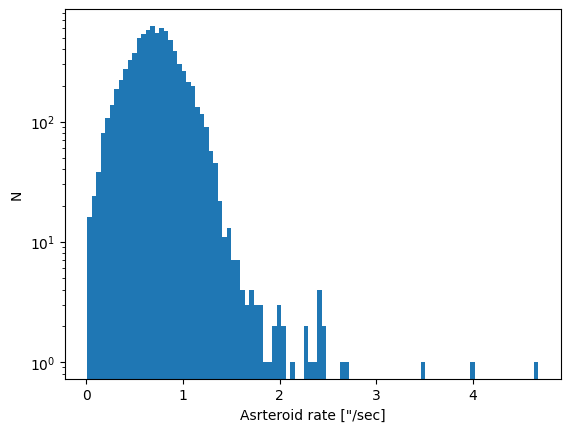

In [25]:
plt.hist(aster_catalog.rate.values / 60, bins=100, log=True)
plt.xlabel('Asrteroid rate ["/sec]')
plt.ylabel('N')
plt.show()

In [26]:
aster_catalog.query("rate / 60 >= 1 and V_mag <= 18")

,Object name,Astrometric RA (hh:mm:ss),"Astrometric Dec (dd mm'ss"")","Dist. from center RA ("")","Dist. from center Dec ("")","Dist. from center Norm ("")",Visual magnitude (V),"RA rate (""/h)","Dec rate (""/h)",ra,...,Perihelion (au),Time of perihelion passage (JD),Longitude of ascending node (deg),Argument of perihelion (deg),Inclination (deg),Epoch (JD),H_mag,name_y,id_y,rate
0,620 Drakonia (A906 UO),17:49:08.50,-29:33:27.8,-489.0,-2000.0,2433.0,16.1,60.09,-5.175,267.285417,...,2.108700,2.460346e+06,359.917850,336.710440,7.733843,2460600.5,11.00,620 Drakonia,A906 UO,60.312426
877,13401 (1999 RA133),17:50:46.87,-30:35:10.0,802.0,-6000.0,6138.0,17.9,71.77,-1.905,267.695292,...,2.117081,2.459856e+06,299.826350,345.507140,9.904066,2460600.5,13.12,13401,1999 RA133,71.795278
1719,161 Athor (A876 HA),17:48:19.37,-29:17:23.5,-1000.0,-1000.0,1816.0,14.2,67.12,-10.100,267.080708,...,2.054477,2.460324e+06,18.545809,295.058200,9.055878,2460600.5,9.33,161 Athor,A876 HA,67.875654
2881,4558 Janesick (1988 NF),17:48:42.76,-28:28:25.7,-827.0,2000.0,1730.0,17.4,59.37,12.180,267.178167,...,1.401912,2.460494e+06,254.798210,94.455545,22.183357,2460600.5,12.83,4558 Janesick,1988 NF,60.606512
3917,9214 (1995 UC6),17:50:28.62,-29:58:30.1,563.0,-4000.0,3926.0,18.0,74.79,-6.475,267.619250,...,1.798703,2.460423e+06,319.996260,335.644660,6.474795,2460600.5,13.90,9214,1995 UC6,75.069766
4266,4570 Runcorn (1985 PR),17:49:08.28,-28:18:12.9,-492.0,2000.0,2188.0,17.7,64.26,-7.537,267.284500,...,1.956961,2.460174e+06,349.160810,209.001770,5.015215,2460600.5,13.45,4570 Runcorn,1985 PR,64.700494


In [112]:
def get_asteroid_trail(ra0, dec0, rate_ra=60., rate_dec=60., exp_time=60.0, step=1.0):
    """
    Calculates the RA and Dec coordinates of an asteroid trail.

    This function simulates the movement of an asteroid across the sky during an
    exposure, given its initial position and rates of change in right ascension
    and declination.  It returns a list of RA/Dec coordinates representing
    the trail.

    Parameters
    ----------
    ra0 : float
        Initial right ascension of the asteroid (degrees).
    dec0 : float
        Initial declination of the asteroid (degrees).
    rate_ra : float, optional
        Rate of change of right ascension (arcsec/hour).
        Defaults to 1 arcminute per hour (60 arcsec/hour).
    rate_dec : float, optional
        Rate of change of declination (arcsec/hour).
        Defaults to 1 arcminute per hour (60 arcsec/hour).
    exp_time : float, optional
        Exposure time (seconds). Defaults to 60 seconds.
    step : float, optional
        Time step for calculating trail points (seconds).
        Smaller steps result in smoother trails. Defaults to 1 second.
    """
    if not isinstance(ra0, (int, float)):
        raise TypeError("ra0 must be a number.")
    if not isinstance(dec0, (int, float)):
        raise TypeError("dec0 must be a number.")
    if not isinstance(rate_ra, (int, float)):
        raise TypeError("rate_ra must be a number.")
    if not isinstance(rate_dec, (int, float)):
        raise TypeError("rate_dec must be a number.")
    if not isinstance(exp_time, (int, float)):
        raise TypeError("exp_time must be a number.")
    if not isinstance(step, (int, float)):
        raise TypeError("step must be a number.")

    if exp_time <= 0:
        raise ValueError("exp_time must be positive.")
    if step <= 0:
        raise ValueError("step must be positive.")

    # time array in seconds
    times = np.arange(0, exp_time + step, step)
    # rate / 3600 -> arcsec / sec
    # travel distance / 3600 -> deg
    ras = ra0 + (rate_ra / 3600 * times) / 3600
    decs = dec0 + (rate_dec / 3600 * times) / 3600
    return ras, decs

### Fake asteroids positions, speeds, and brightness

In [113]:
import os

In [121]:
aster_param_file = "../data/catalogs/simulated_asteroids_parameters_catalog.ecsv"
gen_cat = False
N = 20
if gen_cat:
    print("Generating catalog")
    asteroids_sim = pd.DataFrame(index=np.arange(0, N), columns=["ra0", "dec0", "rate_ra", "rate_dec", "vmag", "F146"])
    
    asteroids_sim.ra0 = np.random.uniform(ra.min() + 10/3600, ra.max() - 10/3600, N)
    asteroids_sim.dec0 = np.random.uniform(dec.min() + 10/3600, dec.max() - 10/3600, N)
    
    asteroids_sim.rate_ra = np.random.uniform(1, 200, N)
    asteroids_sim.rate_dec = np.random.uniform(1, 200, N)
    
    asteroids_sim.vmag = np.random.uniform(14, 22, N)
    asteroids_sim.F146 = 10 ** ( asteroids_sim.vmag/ (-2.5))
    Table.from_pandas(asteroids_sim).write(aster_param_file, overwrite=True)
else:
    if os.path.isfile(aster_param_file):
        print("Loading from file")
        asteroids_sim = Table.read(aster_param_file).to_pandas()
    else:
        print("No local catalog, please generate one...")

asteroids_sim

Loading from file


,ra0,dec0,rate_ra,rate_dec,vmag,F146,ra_mean,dec_mean
0,268.638614,-28.521707,34.370200,101.855509,17.568457,9.388950e-08,268.638784,-28.521204
1,268.617288,-28.493894,133.156210,16.655658,17.796124,7.612902e-08,268.617945,-28.493812
2,268.723814,-28.489361,78.135009,87.905619,18.164544,5.422285e-08,268.724200,-28.488927
3,268.617313,-28.517227,193.298275,91.521592,21.532755,2.437239e-09,268.618268,-28.516775
4,268.629243,-28.504772,28.415542,30.135925,17.988284,6.378025e-08,268.629384,-28.504623
5,268.614533,-28.477179,136.291065,117.390905,16.775539,1.948877e-07,268.615206,-28.476599
6,268.654142,-28.540609,102.604739,170.244322,19.166613,2.154541e-08,268.654649,-28.539768
7,268.643997,-28.507154,13.307507,165.323658,16.923613,1.700415e-07,268.644063,-28.506337
8,268.639893,-28.570465,50.205726,133.396179,18.847520,2.890626e-08,268.640141,-28.569806
9,268.701704,-28.508795,111.751512,46.554169,16.676252,2.135498e-07,268.702256,-28.508566


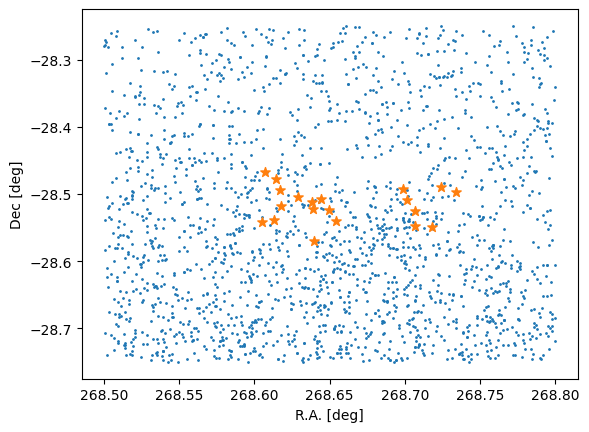

In [115]:
plt.scatter(bright_catalog["ra"].value, bright_catalog["dec"].value, s=1)
for k, row in asteroids_sim.iterrows():
    plt.scatter(row.ra0, row.dec0, s=50, marker="*", c="tab:orange")
    # plt.plot(ra_ast, dec_ast, c="tab:orange")
plt.xlabel("R.A. [deg]")
plt.ylabel("Dec [deg]")
plt.show()

### Inject trajectories in input catalog

In [116]:
exp_time = image_l1["roman"]["meta"]["exposure"]["exposure_time"]

In [120]:
if gen_cat:
    asttrac_cat = []
    
    colnames = ["ra", "dec", "F146", "g_mag"]
    
    for k, row in asteroids_sim.iterrows():
        ra_ast, dec_ast = get_asteroid_trail(row.ra0, row.dec0, 
                                             rate_ra=row.rate_ra, 
                                             rate_dec=row.rate_dec, 
                                             exp_time=np.round(exp_time), 
                                             step=1.0)
        asteroids_sim.loc[k, "ra_mean"] = np.nanmean(ra_ast)
        asteroids_sim.loc[k, "dec_mean"] = np.nanmean(dec_ast)
        asttrac_cat.append(pd.DataFrame(np.vstack([ra_ast, dec_ast, [row.F146] * len(ra_ast), [row.vmag] * len(ra_ast)]).T, columns=colnames))
        
    
    asttrac_cat = pd.concat(asttrac_cat, axis=0)
    asttrac_cat.loc[:, "type"] = "PSF"
    asttrac_cat.loc[:, "n"] = -1
    asttrac_cat.loc[:, "half_light_radius"] = -1
    asttrac_cat.loc[:, "pa"] = -1
    asttrac_cat.loc[:, "ba"] = -1
    Table.from_pandas(asteroids_sim).write(aster_param_file, overwrite=True)
    Table.from_pandas(asttrac_cat).write("../data/catalogs/simulated_asteroids_input_catalog.ecsv", overwrite=True)
else:
    aster_input_file = "../data/catalogs/simulated_asteroids_input_catalog.ecsv"
    if os.path.isfile(aster_input_file):
        print("Loading from local file")
        asttrac_cat = Table.read(aster_input_file).to_pandas()
    else:
        print("No local input catalog, please generate one...")

asttrac_cat

Loading from local file


,ra,dec,F146,g_mag,type,n,half_light_radius,pa,ba
0,268.638614,-28.521707,9.388950e-08,17.568457,PSF,-1,-1,-1,-1
1,268.638617,-28.521699,9.388950e-08,17.568457,PSF,-1,-1,-1,-1
2,268.638620,-28.521691,9.388950e-08,17.568457,PSF,-1,-1,-1,-1
3,268.638622,-28.521683,9.388950e-08,17.568457,PSF,-1,-1,-1,-1
4,268.638625,-28.521675,9.388950e-08,17.568457,PSF,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...
2575,268.735490,-28.495884,1.677510e-09,21.938337,PSF,-1,-1,-1,-1
2576,268.735502,-28.495872,1.677510e-09,21.938337,PSF,-1,-1,-1,-1
2577,268.735513,-28.495861,1.677510e-09,21.938337,PSF,-1,-1,-1,-1
2578,268.735525,-28.495850,1.677510e-09,21.938337,PSF,-1,-1,-1,-1


# Simulate L1 image with asteroids

In [127]:
args = argparse.Namespace()
args.filename = "../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_l0.asdf"
args.bandpass = "F146"
args.boresight = False
args.catalog = "../data/catalogs/simulated_asteroids_input_catalog.ecsv"
args.config = None
args.date = time.iso.split(" ")[0]
args.level = 0
args.ma_table_number = 4
args.nobj = 5000
args.previous = None
args.radec = (268.75, -28.41)
args.rng_seed = 10
args.roll = 0
args.sca = 2
args.usecrds = True
args.webbpsf = False
args.truncate = None
args.pretend_spectral = None
args.drop_extra_dq = False
args.scale_factor = -1

vars(args)

{'filename': '../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_l0.asdf',
 'bandpass': 'F146',
 'boresight': False,
 'catalog': '../data/catalogs/simulated_asteroids_input_catalog.ecsv',
 'config': None,
 'date': '2027-02-14',
 'level': 0,
 'ma_table_number': 4,
 'nobj': 5000,
 'previous': None,
 'radec': (268.75, -28.41),
 'rng_seed': 10,
 'roll': 0,
 'sca': 2,
 'usecrds': True,
 'webbpsf': False,
 'truncate': None,
 'pretend_spectral': None,
 'drop_extra_dq': False,
 'scale_factor': -1}

In [128]:
metadata = ris.set_metadata(
        date=args.date, bandpass=args.bandpass,
        sca=args.sca, ma_table_number=args.ma_table_number,
        truncate=args.truncate, scale_factor=args.scale_factor)
if args.radec is not None:
        coord = SkyCoord(ra=args.radec[0] * u.deg, dec=args.radec[1] * u.deg,
                         frame='icrs')
        wcs.fill_in_parameters(metadata, coord, boresight=args.boresight, pa_aper=args.roll)
metadata

{'instrument': {'name': 'WFI', 'detector': 'WFI02', 'optical_element': 'F146'},
 'ephemeris': {'time': np.float64(61450.0),
  'spatial_x': np.float64(-120591082.38586132),
  'spatial_y': np.float64(77705971.07916296),
  'spatial_z': np.float64(33696754.929317),
  'velocity_x': np.float64(-17.689423226082287),
  'velocity_y': np.float64(-22.404094686951428),
  'velocity_z': np.float64(-9.711731891155186)},
 'exposure': {'start_time': <Time object: scale='utc' format='isot' value=2027-02-14T00:00:00.000>,
  'type': 'WFI_IMAGE',
  'ma_table_number': 4,
  'read_pattern': [[1],
   [2],
   [3, 4],
   [5, 6, 7, 8, 9],
   [10, 11, 12, 13, 14, 15, 16, 17],
   [18, 19, 20, 21, 22, 23, 24, 25],
   [26, 27, 28, 29, 30, 31, 32, 33],
   [34, 35, 36, 37, 38, 39, 40, 41],
   [42]],
  'truncated': False},
 'pointing': {'target_ra': np.float64(268.75),
  'target_dec': np.float64(-28.41),
  'target_aperture': 'WFI_CEN'},
 'velocity_aberration': {'scale_factor': np.float64(1.0000008152610356)},
 'wcsinfo'

In [129]:
log.setLevel(logging.INFO)
rng = galsim.UniformDeviate(args.rng_seed)
cat = ris.create_catalog(metadata=metadata, catalog_name=args.catalog,
                             bandpasses=[args.bandpass], rng=rng,
                             nobj=args.nobj, usecrds=args.usecrds)
persist = persistence.Persistence()
len(cat)

2580

In [131]:
log.setLevel(logging.INFO)

ris.simulate_image_file(args, metadata, cat, rng, persist)

2025-02-10 19:20:23 WARNING  max(flat) > 1.1; this seems weird?!
2025-02-10 19:20:23,247 - stpipe - WARNING - max(flat) > 1.1; this seems weird?!
2025-02-10 19:20:23 WARNING  max(flat) > 1.1; this seems weird?!


In [141]:
img_ast_l0 = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_l0.asdf")
img_ast_l1 = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_uncal.asdf")
img_ast_l1.info(max_rows=(None))

root (AsdfObject)
├─asdf_library (Software)
│ ├─author (str): The ASDF Developers
│ ├─homepage (str): http://github.com/asdf-format/asdf
│ ├─name (str): asdf
│ └─version (str): 3.5.0
├─history (dict)
│ └─extensions (list)
│   ├─[0] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://asdf-format.org/core/extensions/core-1.5.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): asdf_standard
│   │ │ └─version (str): 1.1.1
│   │ └─software (Software)
│   │   ├─name (str): asdf-astropy
│   │   └─version (str): 0.7.0
│   ├─[1] (ExtensionMetadata)
│   │ ├─extension_class (str): asdf.extension._manifest.ManifestExtension
│   │ ├─extension_uri (str): asdf://stsci.edu/datamodels/roman/extensions/datamodels-1.0
│   │ ├─manifest_software (Software)
│   │ │ ├─name (str): rad
│   │ │ └─version (str): 0.22.0
│   │ └─software (Software)
│   │   ├─name (str): roman_datamodels
│   │   └─version (str): 0.22.0
│   ├─[2] 

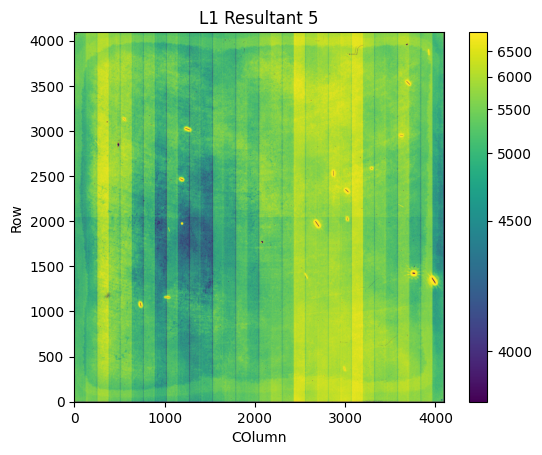

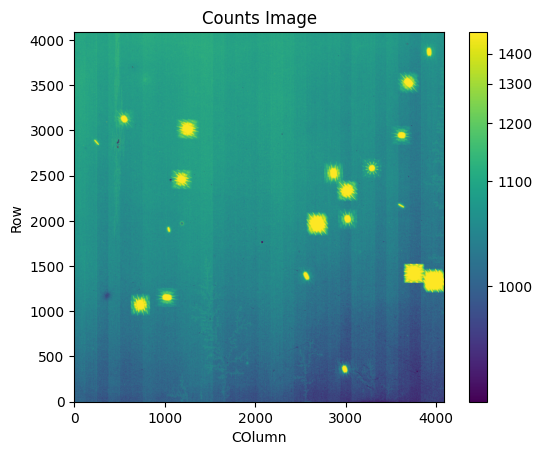

In [144]:
norm = simple_norm(img_ast_l1["roman"]["data"][ro_n], "asinh", percent=98)

cbar = plt.imshow(img_ast_l1["roman"]["data"][ro_n], origin="lower", norm=norm)
plt.colorbar(cbar)
plt.xlabel("COlumn")
plt.ylabel("Row")
plt.title(f"L1 Resultant {ro_n}")
plt.show()

norm = simple_norm(img_ast_l0["roman"]["data"], "asinh", percent=98)

cbar = plt.imshow(img_ast_l0["roman"]["data"], origin="lower", norm=norm)
plt.colorbar(cbar)
plt.xlabel("COlumn")
plt.ylabel("Row")
plt.title(f"Counts Image")
plt.show()

In [43]:
img_ast_l2rc = asdf.open("../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_cal_romancal.asdf")

In [52]:
with rdm.open("../data/imgs/roman_wfi_F146_gbtds_s01_asteroids_cal_romancal.asdf") as model:
    wcs_sol = wcs.get_wcs(model)
row, col = np.mgrid[0 : img_ast_l2rc["roman"]["data"].shape[0], 0 : img_ast_l2rc["roman"]["data"].shape[1]]
ra, dec = wcs_sol.toWorld(col, row, units="deg")

In [44]:
np.unique(img_ast_l2rc["roman"]["dq"])

array([       0,        1,        4,        5,     1025,     1029,
           8192,     8193,     8196,     9217,     9219,     9221,
          65536,    65537,    65540,    66561,    66565,    73728,
          74753,    74757,  1048576,  1049601,  1056768,  1057793,
        1114112,  1115137,  1122304,  1123329, 33554432, 33554435,
       33554436, 33555457, 33555459, 33555461, 33562624, 33562627,
       33562628, 33562629, 33563649, 33563651, 33563653, 33619968,
       33619971, 33619972, 33619973, 33620993, 33620995, 33620997,
       33628160, 33628163, 33628164, 33628165, 33629185, 33629187,
       33629189, 34603008, 34604033, 34611200, 34612225, 34612227,
       34612229, 34668544, 34669569, 34676736, 34676740, 34677761,
       34677763, 34677765], dtype=uint32)

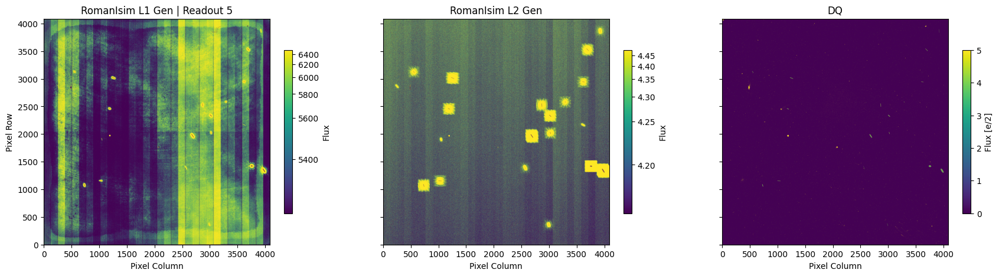

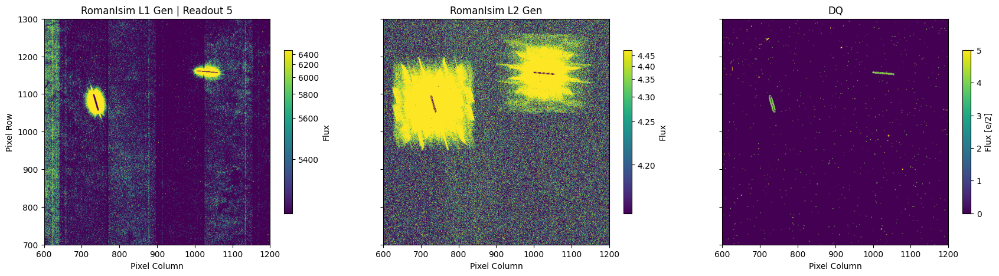

In [45]:
norml1 = simple_norm(img_ast_l1["roman"]["data"][ro_n], "asinh", min_percent=40, max_percent=95)
norml2 = simple_norm(img_ast_l2rc["roman"]["data"], "asinh", min_percent=40, max_percent=95)

fig, ax = plt.subplots(1, 3, figsize=(21,6), sharex=True, sharey=True)

cbar = ax[0].imshow(img_ast_l1["roman"]["data"][ro_n], origin="lower", norm=norml1)
plt.colorbar(cbar, ax=ax[0], label="Flux", shrink=0.6)
ax[0].set_ylabel("Pixel Row")
ax[0].set_xlabel("Pixel Column")
ax[0].set_title(f"RomanIsim L1 Gen | Readout {ro_n}")

cbar = ax[1].imshow(img_ast_l2rc["roman"]["data"], origin="lower", norm=norml2)
plt.colorbar(cbar, ax=ax[1], label="Flux", shrink=0.6)
ax[1].set_xlabel("Pixel Column")
ax[1].set_title("RomanIsim L2 Gen")

cbar = ax[2].imshow(img_ast_l2rc["roman"]["dq"], origin="lower", cmap="viridis", vmin=0, vmax=5)
plt.colorbar(cbar, ax=ax[2], label="Flux [e/2]", shrink=0.6)
ax[2].set_xlabel("Pixel Column")
ax[2].set_title("DQ")

plt.show()

In [54]:
asteroids_sim

,ra0,dec0,rate_ra,rate_dec,vmag,F146
0,268.638614,-28.521707,34.370200,101.855509,17.568457,9.388950e-08
1,268.617288,-28.493894,133.156210,16.655658,17.796124,7.612902e-08
2,268.723814,-28.489361,78.135009,87.905619,18.164544,5.422285e-08
3,268.617313,-28.517227,193.298275,91.521592,21.532755,2.437239e-09
4,268.629243,-28.504772,28.415542,30.135925,17.988284,6.378025e-08
5,268.614533,-28.477179,136.291065,117.390905,16.775539,1.948877e-07
6,268.654142,-28.540609,102.604739,170.244322,19.166613,2.154541e-08
7,268.643997,-28.507154,13.307507,165.323658,16.923613,1.700415e-07
8,268.639893,-28.570465,50.205726,133.396179,18.847520,2.890626e-08
9,268.701704,-28.508795,111.751512,46.554169,16.676252,2.135498e-07


In [82]:
def dq_has_value(mask, bit=0):
    has_jump = []
    for n in np.unique(mask):
        brep = np.binary_repr(n, width=32)
        if brep[-(bit+1)] == "1":
            has_jump.append(n)
        # print(n, brep)
    has_jump = np.array(has_jump)
    return has_jump

In [159]:
img_ast_l1["roman"]["meta"]["exposure"]

{'type': 'WFI_IMAGE', 'start_time': <Time object: scale='utc' format='isot' value=2027-02-14T00:00:00.000>, 'mid_time': <Time object: scale='utc' format='isot' value=2027-02-14T00:01:03.840>, 'end_time': <Time object: scale='utc' format='isot' value=2027-02-14T00:02:07.680>, 'nresultants': 9, 'data_problem': False, 'frame_time': 3.04, 'exposure_time': 127.68, 'effective_exposure_time': 124.64, 'ma_table_name': '?', 'ma_table_number': 4, 'read_pattern': [[1], [2], [3, 4], [5, 6, 7, 8, 9], [10, 11, 12, 13, 14, 15, 16, 17], [18, 19, 20, 21, 22, 23, 24, 25], [26, 27, 28, 29, 30, 31, 32, 33], [34, 35, 36, 37, 38, 39, 40, 41], [42]], 'truncated': False}

Asteroid 1
Rate 107.50 arcsec/h
F146 Mag 17.57


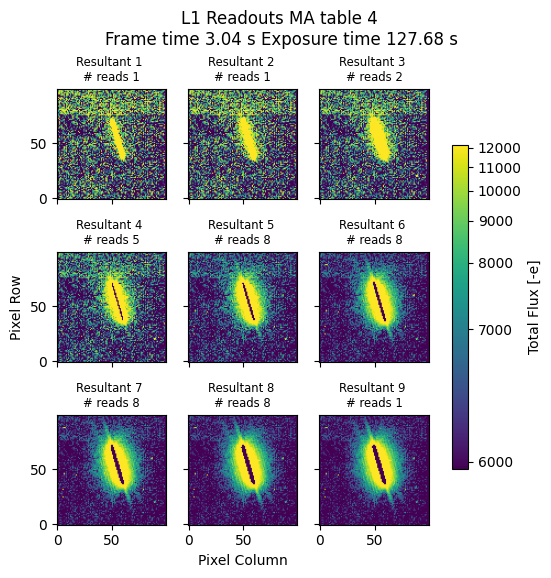

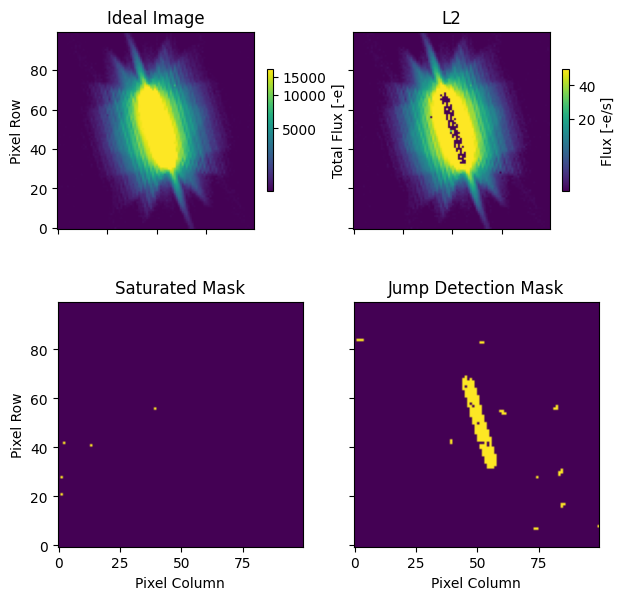

Asteroid 2
Rate 134.19 arcsec/h
F146 Mag 17.80


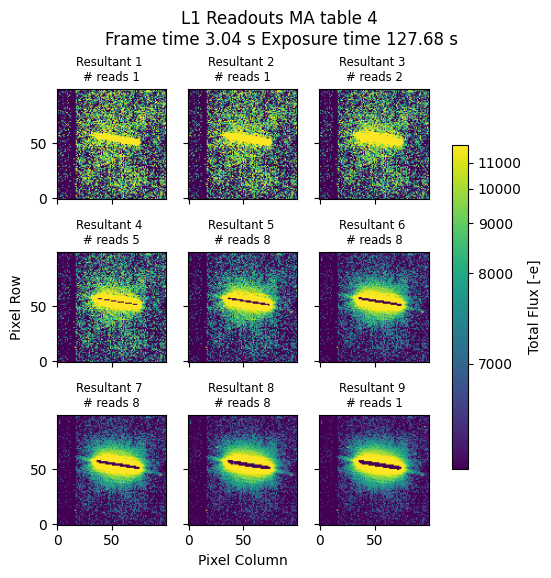

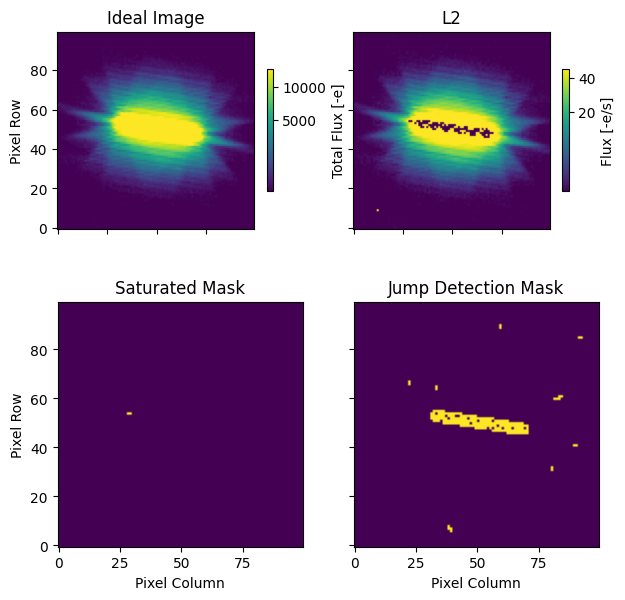

Asteroid 3
Rate 117.61 arcsec/h
F146 Mag 18.16


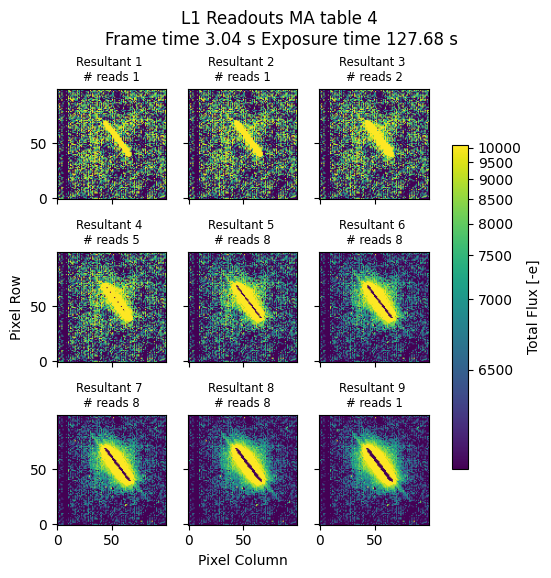

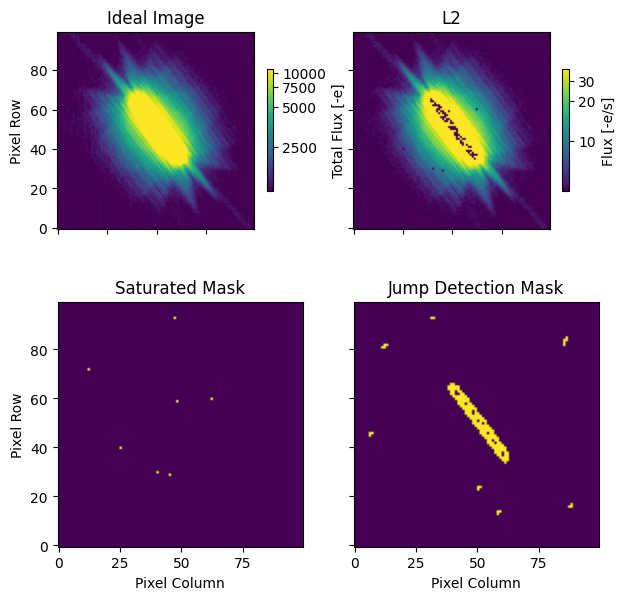

Asteroid 4
Rate 213.87 arcsec/h
F146 Mag 21.53


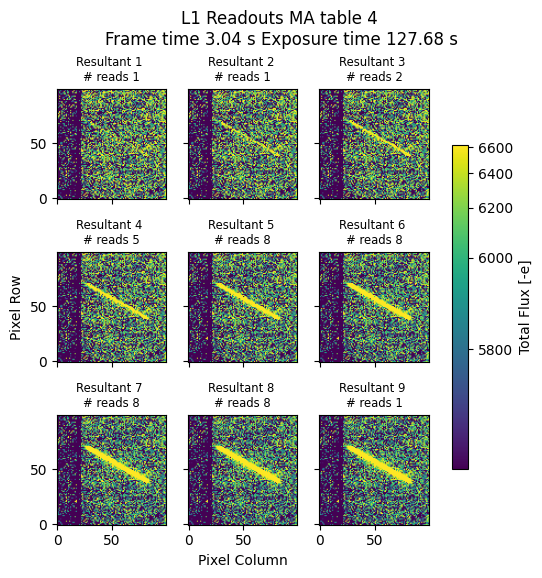

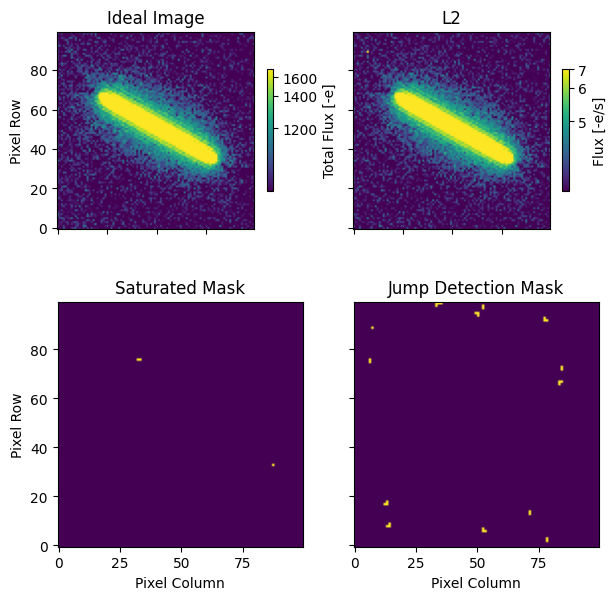

Asteroid 5
Rate 41.42 arcsec/h
F146 Mag 17.99


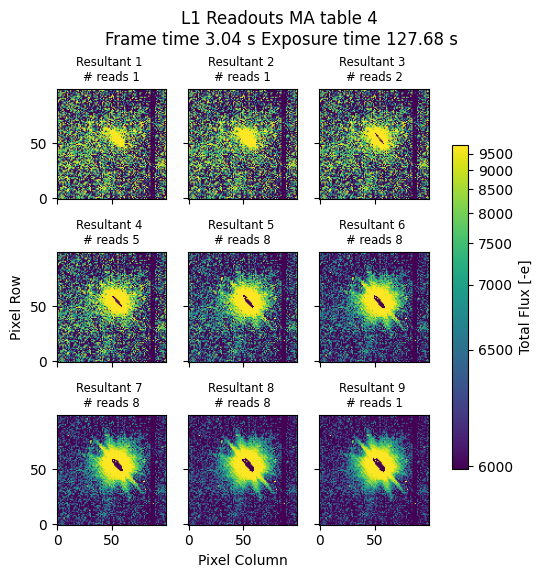

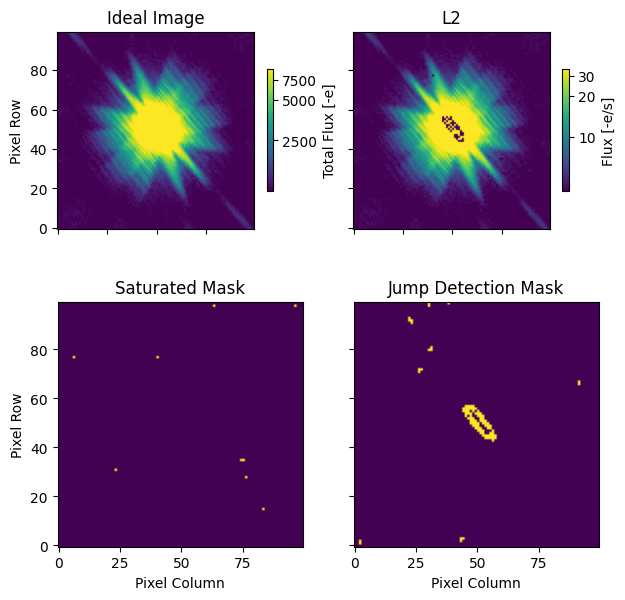

Asteroid 6
Rate 179.88 arcsec/h
F146 Mag 16.78


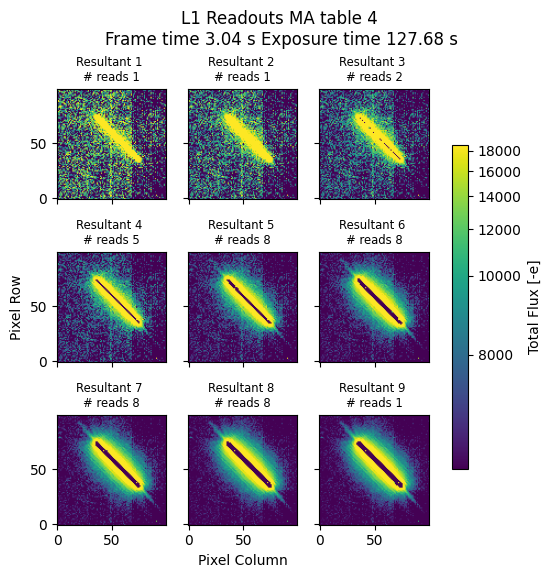

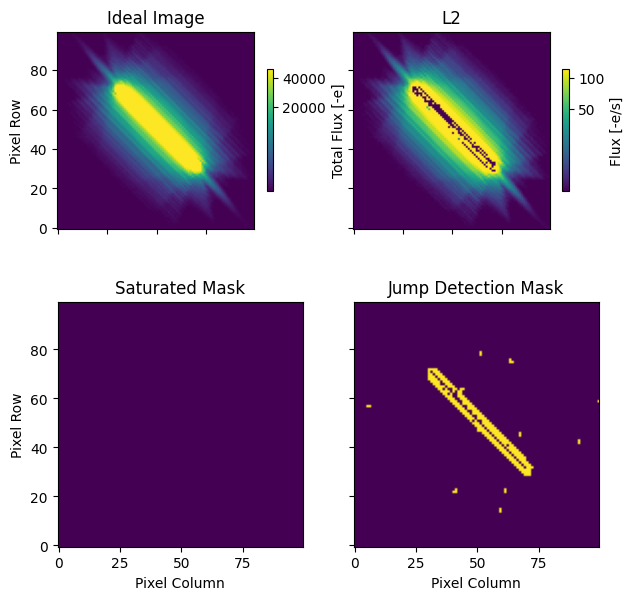

Asteroid 7
Rate 198.77 arcsec/h
F146 Mag 19.17


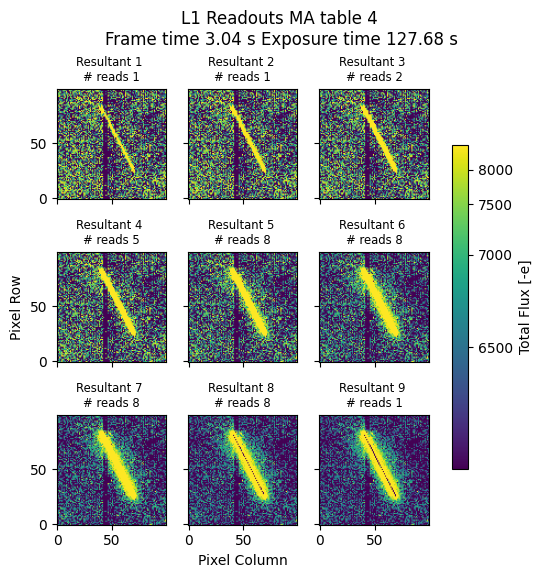

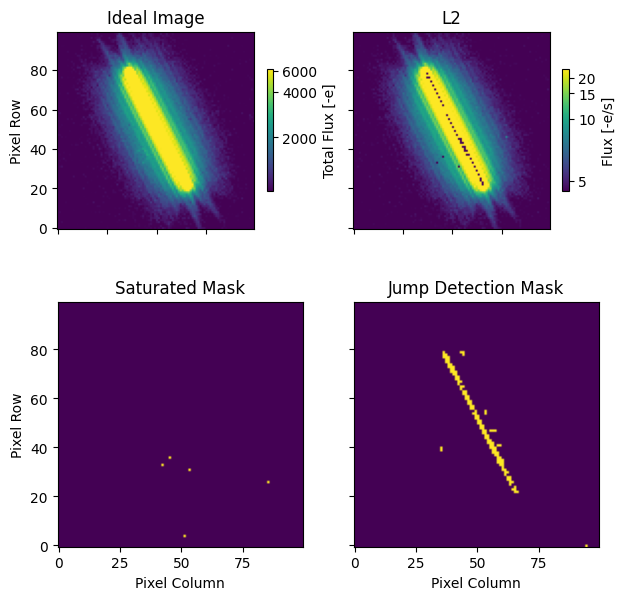

Asteroid 8
Rate 165.86 arcsec/h
F146 Mag 16.92


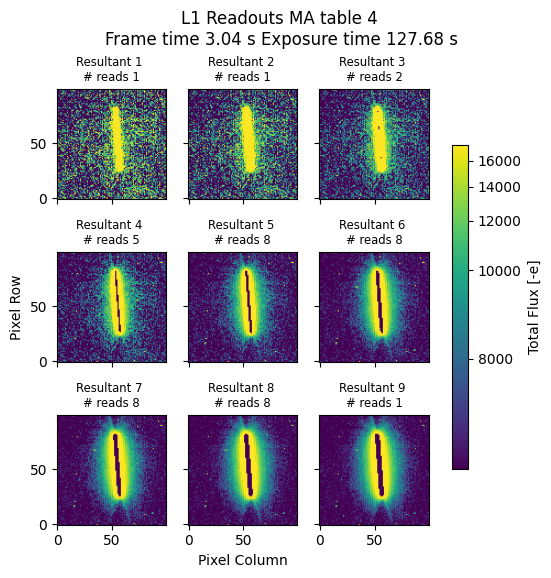

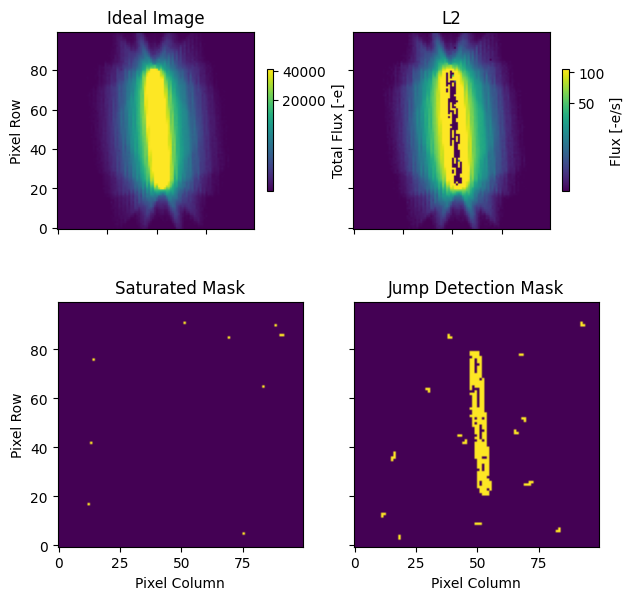

Asteroid 9
Rate 142.53 arcsec/h
F146 Mag 18.85


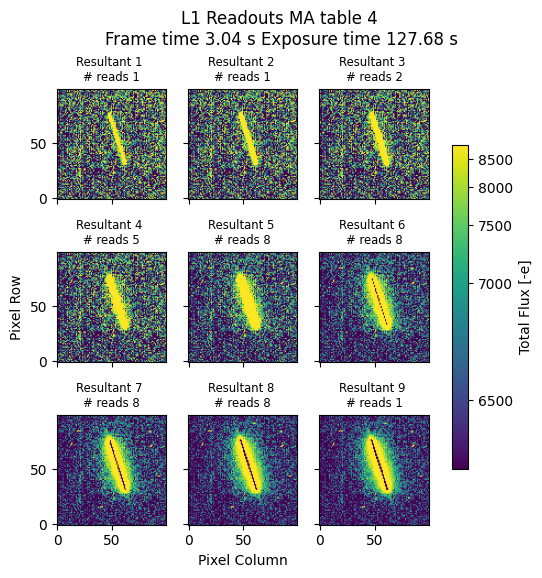

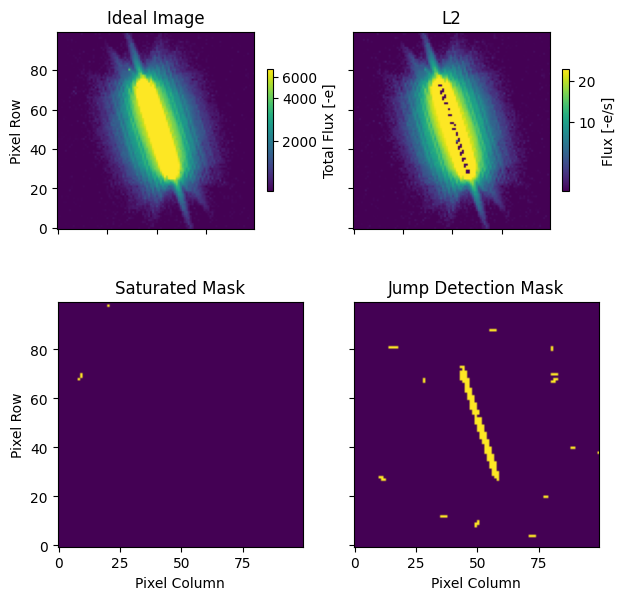

Asteroid 10
Rate 121.06 arcsec/h
F146 Mag 16.68


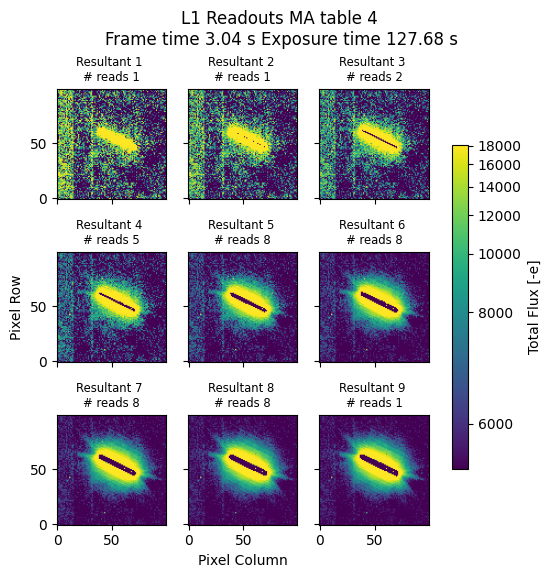

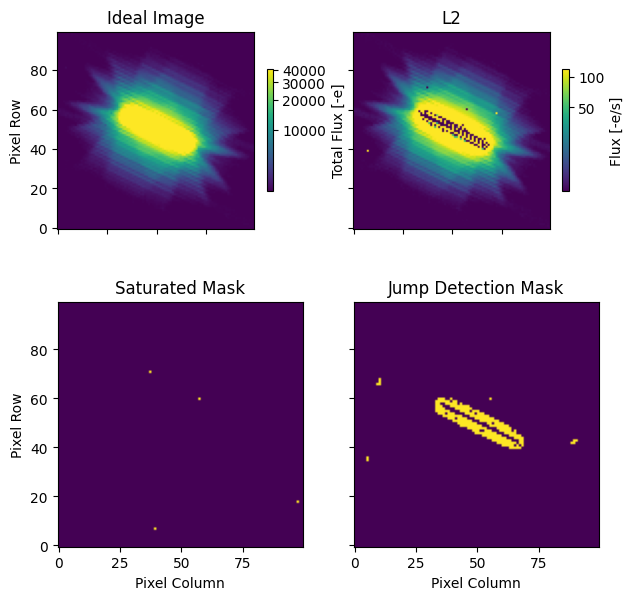

Asteroid 11
Rate 130.16 arcsec/h
F146 Mag 16.30


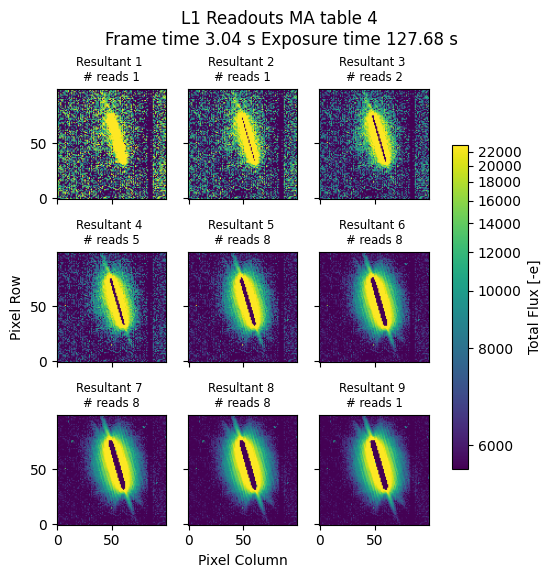

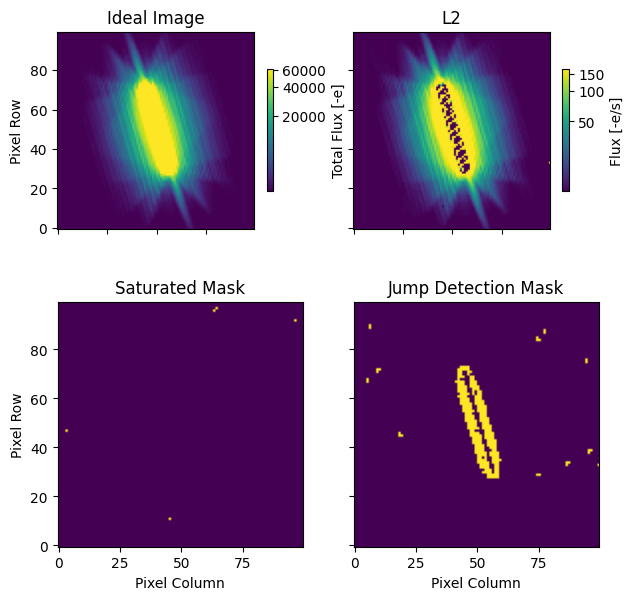

Asteroid 12
Rate 131.08 arcsec/h
F146 Mag 21.27


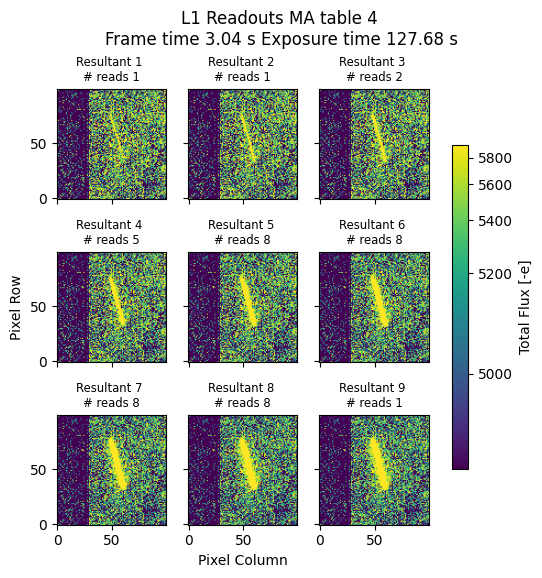

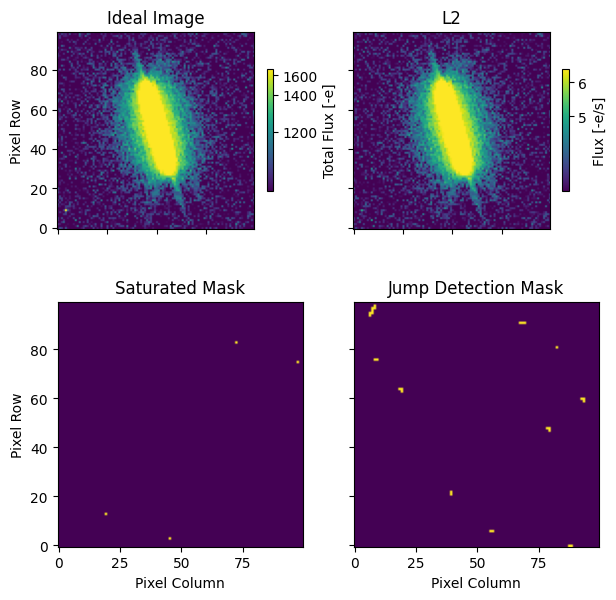

Asteroid 13
Rate 180.14 arcsec/h
F146 Mag 19.08


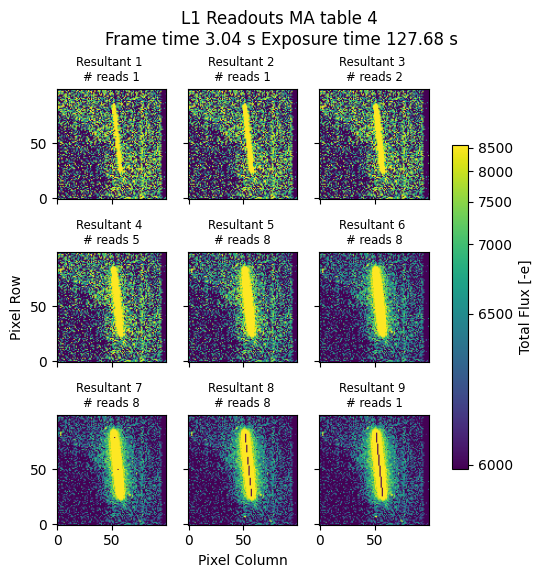

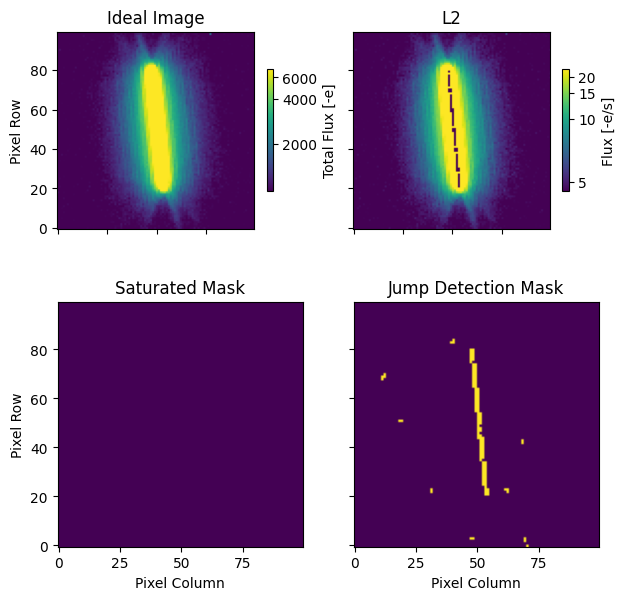

Asteroid 14
Rate 215.87 arcsec/h
F146 Mag 15.08


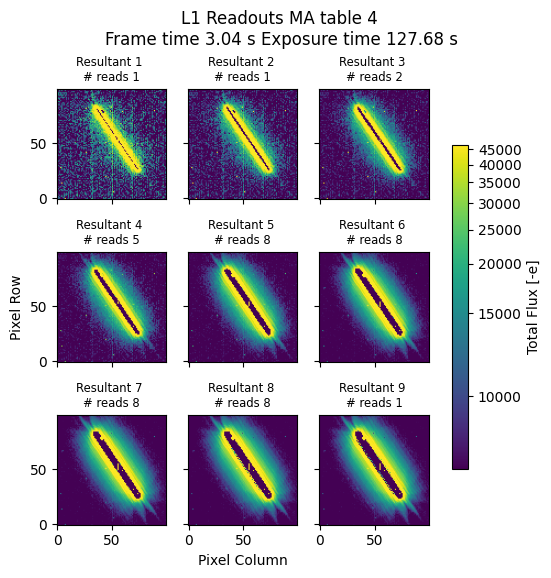

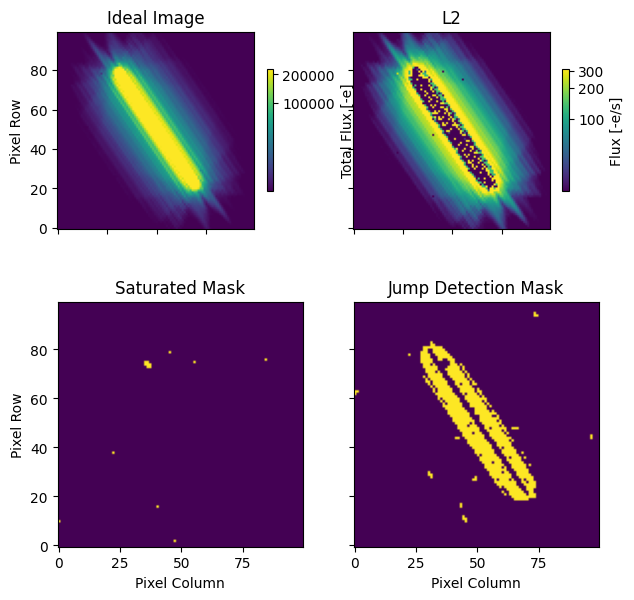

Asteroid 15
Rate 198.42 arcsec/h
F146 Mag 17.50


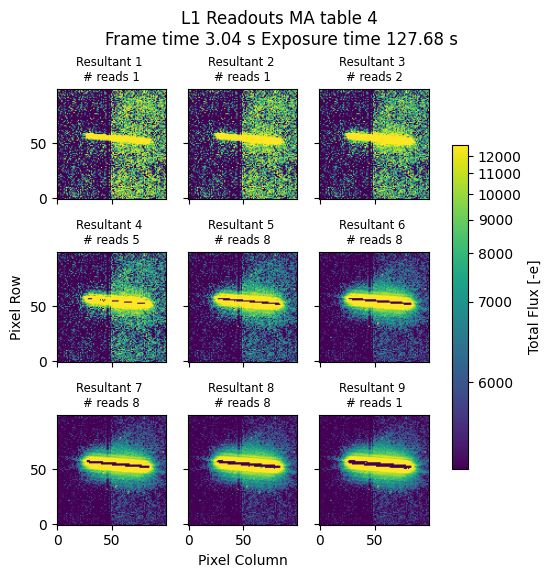

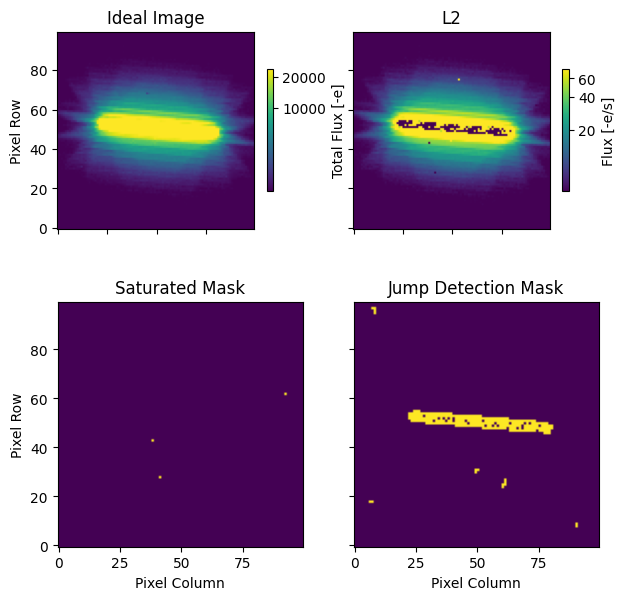

Asteroid 16
Rate 198.83 arcsec/h
F146 Mag 16.29


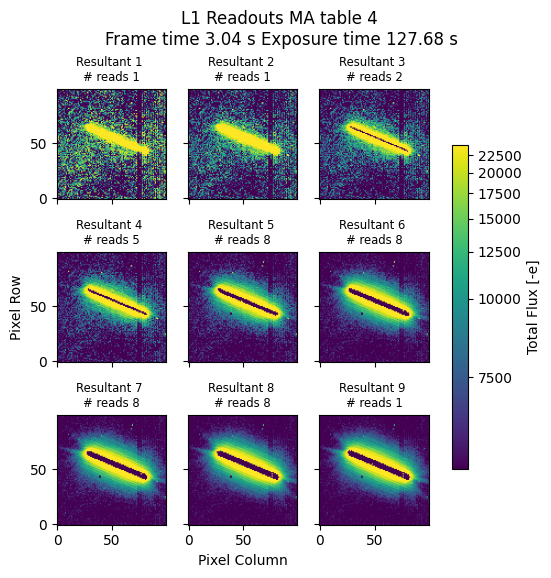

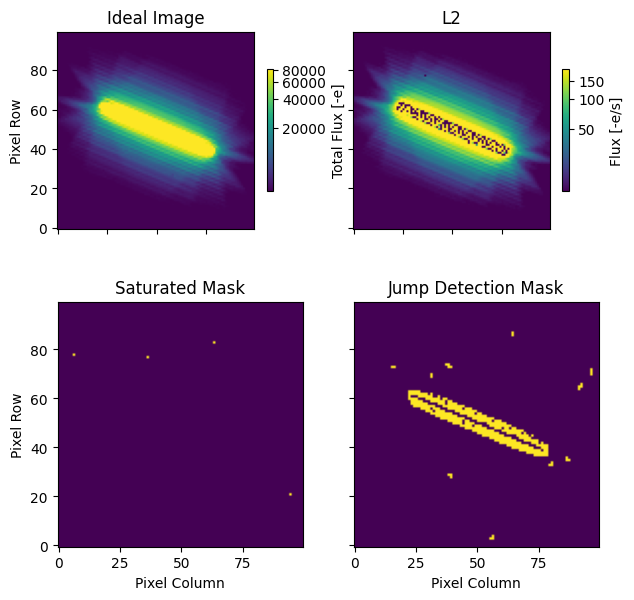

Asteroid 17
Rate 221.87 arcsec/h
F146 Mag 14.07


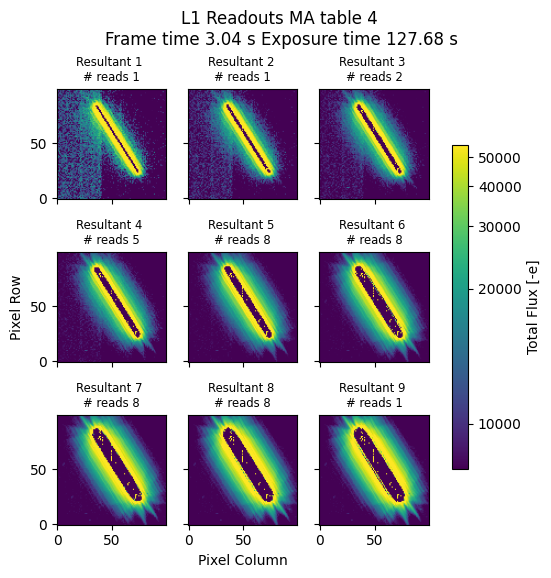

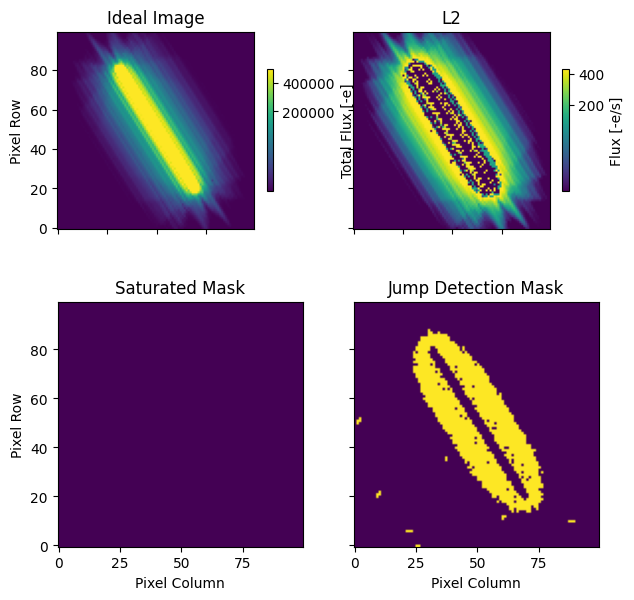

Asteroid 18
Rate 142.79 arcsec/h
F146 Mag 16.10


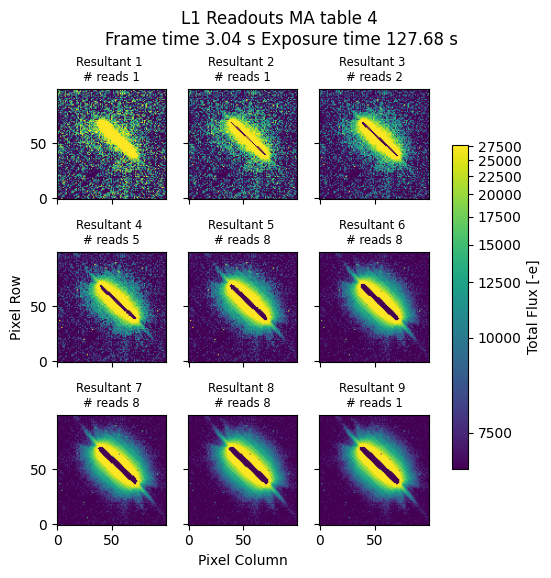

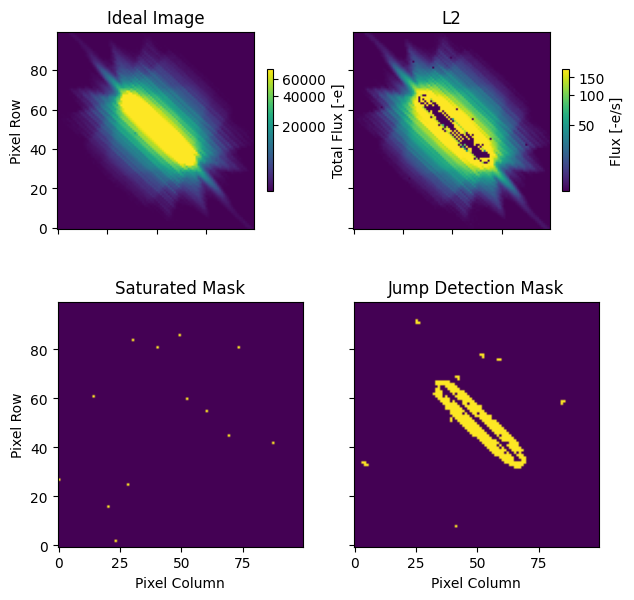

Asteroid 19
Rate 86.73 arcsec/h
F146 Mag 14.51


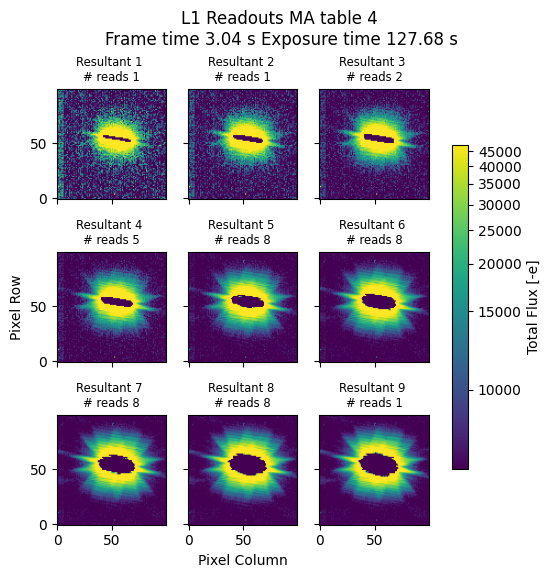

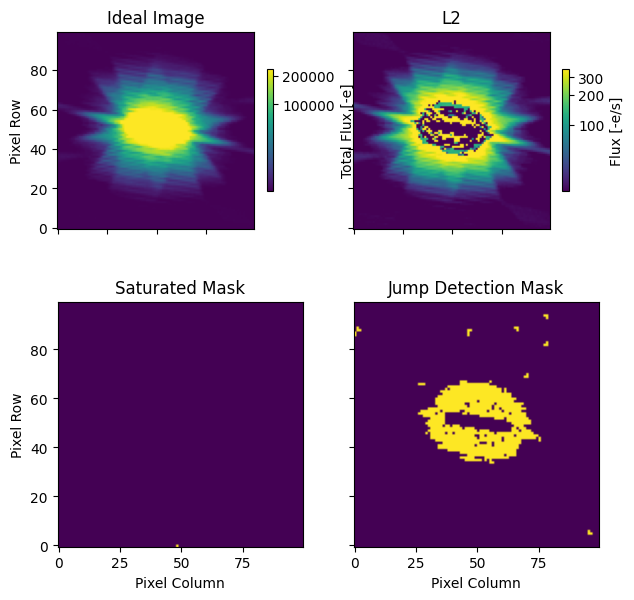

Asteroid 20
Rate 209.30 arcsec/h
F146 Mag 21.94


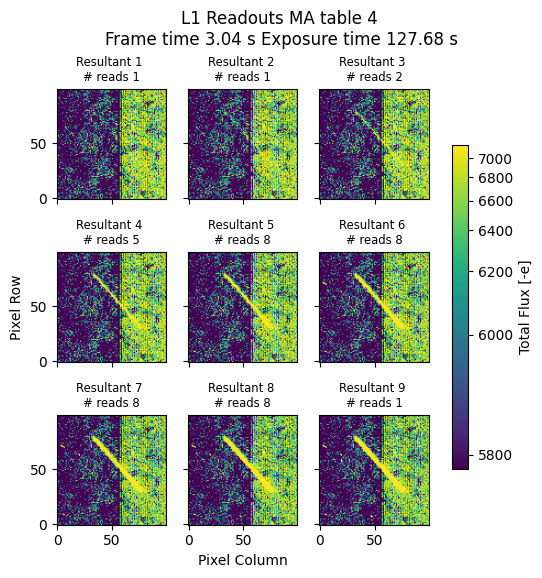

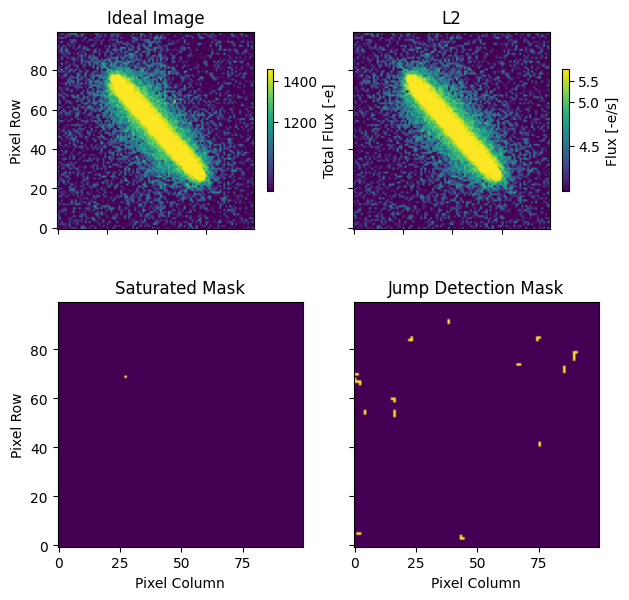

In [170]:
nreads = img_ast_l1["roman"].data.shape[0]
exp_time = img_ast_l1["roman"]["meta"]["exposure"]["exposure_time"]
frm_time = img_ast_l1["roman"]["meta"]["exposure"]["frame_time"]
size = 50

for k, row in asteroids_sim.iterrows():
    print(f"Asteroid {k + 1}")
    print(f"Rate {np.hypot(row.rate_ra, row.rate_dec):.2f} arcsec/h")
    print(f"F146 Mag {row.vmag:.2f}")
    x, y = wcs_sol.toImage(row.ra_mean, row.dec_mean, units="deg")
    xi, xf = int(x - size), int(x + size)
    yi, yf = int(y - size), int(y + size)
    
    fig, ax = plt.subplots(3, 3, figsize=(6, 6), sharex=True, sharey=True)
    fig.suptitle(f"L1 Readouts MA table 4 \nFrame time {frm_time} s Exposure time {exp_time} s", y=0.99)
    for nr, axis in enumerate(ax.ravel()):
        nreads = len(img_ast_l1["roman"]["meta"]["exposure"]["read_pattern"][nr])
        axis.set_title(f"Resultant {nr + 1} \n# reads {nreads}", fontdict={"fontsize": "small"})
        img = img_ast_l1["roman"]["data"][nr][yi:yf, xi:xf]
        norml1 = simple_norm(img, "asinh", min_percent=40, max_percent=95)
        bar = axis.imshow(img, origin="lower", norm=norml1)
    fig.colorbar(bar, ax=ax, shrink=0.7, label="Total Flux [-e]")
    ax[1, 0].set_ylabel("Pixel Row")
    ax[2, 1].set_xlabel("Pixel Column")

    fig_fname = f"asteroid{k:03}_wfi_F146_l1_resultants"
    plt.savefig(f"../data/figures/{fig_fname}.pdf", bbox_inches="tight")
    plt.show()

    fig, ax = plt.subplots(2, 2, figsize=(7, 7), sharex=True, sharey=True)

    iimg = img_ast_l0["roman"]["data"][yi:yf, xi:xf]
    norml0 = simple_norm(iimg, "asinh", min_percent=40, max_percent=95)
    
    img = img_ast_l2rc["roman"]["data"][yi:yf, xi:xf]
    norml2 = simple_norm(img, "asinh", min_percent=40, max_percent=95)

    msk = img_ast_l2rc["roman"]["dq"][yi:yf, xi:xf]
    sat_mask = np.isin(msk.ravel(), dq_has_value(msk, bit=1)).reshape(msk.shape)
    jmp_mask = np.isin(msk.ravel(), dq_has_value(msk, bit=2)).reshape(msk.shape)

    bar = ax[0, 0].imshow(iimg, origin="lower", norm=norml0)
    fig.colorbar(bar, ax=ax[0, 0], shrink=0.5, label="Total Flux [-e]")
    bar = ax[0, 1].imshow(img, origin="lower", norm=norml2)
    fig.colorbar(bar, ax=ax[0, 1], shrink=0.5, label="Flux [-e/s]")
    ax[1, 0].imshow(sat_mask, origin="lower", vmin=0, vmax=1)
    ax[1, 1].imshow(jmp_mask, origin="lower", vmin=0, vmax=1)

    ax[0, 0].set_title("Ideal Image")
    ax[0, 1].set_title("L2")
    ax[1, 0].set_title("Saturated Mask")
    ax[1, 1].set_title("Jump Detection Mask")

    ax[0, 0].set_ylabel("Pixel Row")
    ax[1, 0].set_ylabel("Pixel Row")
    ax[1, 0].set_xlabel("Pixel Column")
    ax[1, 1].set_xlabel("Pixel Column")

    fig_fname = f"asteroid{k:03}_wfi_F146_l2_cal"
    plt.savefig(f"../data/figures/{fig_fname}.pdf", bbox_inches="tight")
    plt.show()

    # break

In [106]:
dq_has_value(msk, bit=7)

array([], dtype=float64)

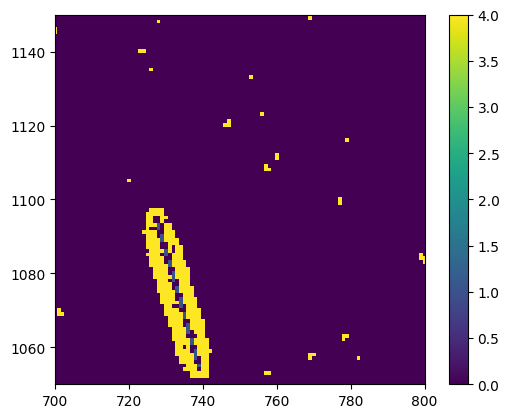

In [46]:
fig1, ax1 = plt.subplots()
cbar = ax1.imshow(img_ast_l2rc["roman"]["dq"], origin="lower", vmin=0, vmax=4)
fig1.colorbar(cbar)
ax1.set_xlim(700, 800)
ax1.set_ylim(1050, 1150)
plt.show()

In [48]:
has_jump = dq_has_value(img_ast_l2rc["roman"]["dq"], bit=4)
has_sat = dq_has_value(img_ast_l2rc["roman"]["dq"], bit=2)
has_jump, has_sat

(array([       4,        5,     1029,     8196,     9221,    65540,
           66565,    74757, 33554436, 33555461, 33562628, 33562629,
        33563653, 33619972, 33619973, 33620997, 33628164, 33628165,
        33629189, 34612229, 34676740, 34677765], dtype=uint32),
 array([       1,        5,     1025,     1029,     8193,     9217,
            9219,     9221,    65537,    66561,    66565,    74753,
           74757,  1049601,  1057793,  1115137,  1123329, 33554435,
        33555457, 33555459, 33555461, 33562627, 33562629, 33563649,
        33563651, 33563653, 33619971, 33619973, 33620993, 33620995,
        33620997, 33628163, 33628165, 33629185, 33629187, 33629189,
        34604033, 34612225, 34612227, 34612229, 34669569, 34677761,
        34677763, 34677765], dtype=uint32))

In [49]:
jump_mask = np.isin(img_ast_l2rc["roman"]["dq"].ravel(), has_jump).reshape(img_ast_l2rc["roman"]["dq"].shape)
sat_mask = np.isin(img_ast_l2rc["roman"]["dq"].ravel(), has_sat).reshape(img_ast_l2rc["roman"]["dq"].shape)

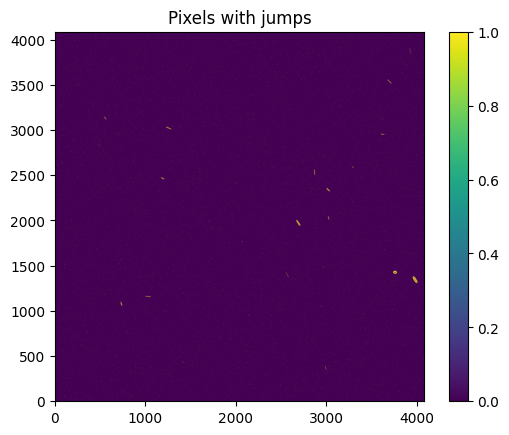

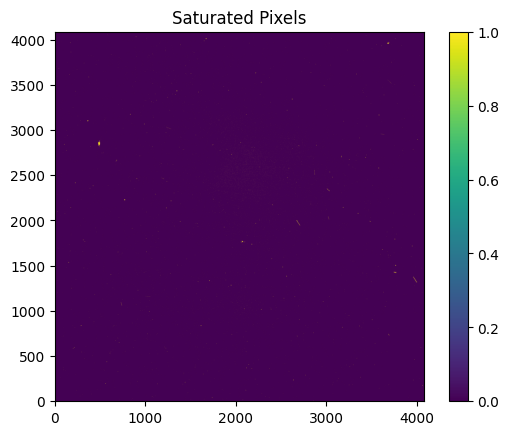

In [51]:
fig1, ax1 = plt.subplots()
cbar = ax1.imshow(jump_mask, origin="lower", vmin=0, vmax=1)
fig1.colorbar(cbar)
ax1.set_title("Pixels with jumps")
# ax1.set_xlim(700, 800)
# ax1.set_ylim(1050, 1150)
plt.show()

fig1, ax1 = plt.subplots()
cbar = ax1.imshow(sat_mask, origin="lower", vmin=0, vmax=1)
fig1.colorbar(cbar)
ax1.set_title("Saturated Pixels")
# ax1.set_xlim(700, 800)
# ax1.set_ylim(1050, 1150)
plt.show()

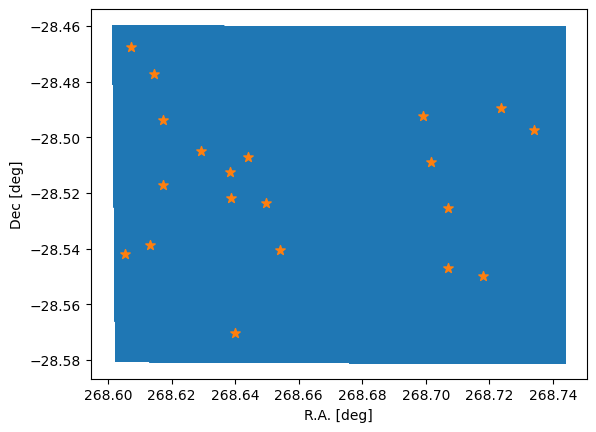

In [90]:
plt.scatter(ra.ravel(), dec.ravel(), s=1, c="tab:blue")
for k, row in asteroids_sim.iterrows():
    plt.scatter(row.ra0, row.dec0, s=50, marker="*", c="tab:orange")
plt.xlabel("R.A. [deg]")
plt.ylabel("Dec [deg]")
plt.show()